In [1]:
import glob
import io
from ipywidgets import interact
from ipywidgets import fixed
from IPython.display import clear_output
import matplotlib.pyplot as plt
import numpy as np
import os
# import openslide
# from openslide import open_slide
import re
from pathlib import Path
import pandas as pd
from PIL import Image, ImageOps, ImageChops
import seaborn as sns
import json
import SimpleITK as sitk
from collections import OrderedDict
from skimage.color import rgb2hed
from skimage.exposure import histogram
from skimage.filters import threshold_otsu
from skimage import morphology
from skimage.transform import rotate
import time
import warnings
import cv2
from scipy.optimize import minimize, rosen, rosen_der
import collections
# from sklearn.preprocessing import MinMaxScaler, StandardScaler
from collections import OrderedDict

In [2]:
material_path = '/QRISdata/Q1851/Minh/RNAScope'
round1_dapi = '2020_05_05_R1_DAPI_TIFF/'
round2_dapi = '2020_05_06_R2_DAPI_TIFF'
dapi_1 = os.path.join(material_path, round1_dapi, '2020_05_05_R1_DAPI_TIFF_s1z1c4.tif')
dapi_2 = os.path.join(material_path, round2_dapi, '2020_05_06_R2_DAPI_TIFF_s1z1c3.tif')
original_czi1_size = (54513, 23814)
original_czi2_size = (14778, 38361)
original_czi3_size = (12890, 20217)
original_czi4_size = (14870, 34710)
#-----------------------------------------------------------
original_czi1_size_s2 = (49329, 21951)
original_czi2_size_s2 = (18361, 45640)

original_czi3_size_s2 = (14792, 32812)
original_czi4_size_s2 = (14870, 34710)

#-----------------------------------------------------------
mu_metric1_s1 = (8858.36, 3689.78)
mu_metric1_s2 = (9015.96, 3567.04)
# mu_metric2_s2 = (3284.13, 9105.20)
# mu_metric3_s2 = (2430.70, 5331.95)
# mu_metric4_s2 = (3107.63, 7976.64)

big_window = 0.1
medium_window = 0.25*0.1
small_window = 0.5*medium_window
qupath_output = '/QRISdata/Q1851/Minh/RNAScope/QuPath_project_1/'

In [3]:
def get_files_in_directory(directory, postfix=""):
    fileNames = [s for s in os.listdir(directory) if not os.path.isdir(os.path.join(directory, s))]
    if not postfix or postfix == "":
        return sorted(fileNames)
    else:
        return sorted([s for s in fileNames if s.lower().endswith(postfix)])
    
def get_files_in_dir_recursively(directory, postfix='json'):
    files = [file for file in glob.glob(os.path.join(directory, '**/*.{0}'.format(postfix)), recursive=True)]
    return files

def get_subdirectories_in_directory(directory, postfix=""):
    dir_names = [s for s in os.listdir(directory) if os.path.isdir(os.path.join(directory, s))]
    return sorted(dir_names)

def mkdirs(dirs):
    if not os.path.exists(dirs):
        os.makedirs(dirs)


def convert_original2scaled(x_coord, y_coord, scaled_size, original_size=original_czi1_size, exclude_rate_h=1.0, exclude_rate_w=1.0):
    return int(x_coord*scaled_size[0]/(original_size[0]*exclude_rate_w)), int(y_coord*scaled_size[1]/(original_size[1]*exclude_rate_h))


def list_to_int(list1D):
    return [int(float(x)) for x in list1D]

def draw_rectangles(img, rects, color=(0, 255, 255), thickness=7):
    clone_image = img.copy()
    for rect in rects:
        pt1 = tuple(list_to_int(rect[0:2]))
        pt2 = tuple(list_to_int(rect[2:]))
        cv2.rectangle(clone_image, pt1, pt2, color, thickness, cv2.FILLED)
    return clone_image

def get_xy_from_fn(fn):
    results = re.findall('x(\d+)_y(\d+)', fn)
    if len(results) == 1:
        x_coord, y_coord = results[0]
        x_coord, y_coord = int(x_coord), int(y_coord)
        return x_coord, y_coord, None
    else:
        x_coord, y_coord = results[-1]
        x_coord, y_coord = int(x_coord), int(y_coord)
        return x_coord, y_coord, [list_to_int(element) for element in results[:-1]]

def substite_file_name(file_name, pattern = 'Cy7',sub_string='Cy5'):
    output = re.sub(pattern, sub_string, file_name)
    return output 

def thumbnail(img, size = (1000,1000)):
    img_thumbnail = img.copy()
    img_thumbnail.thumbnail(size)
    return img_thumbnail

In [4]:
def get_itk_from_pil(pil_img):
    """Converts Pillow image into ITK image
    """
    return sitk.GetImageFromArray(np.array(pil_img))

def get_pil_from_itk(itk_img):
    """Converts ITK image into Pillow Image
    """
    return Image.fromarray(sitk.GetArrayFromImage(itk_img).astype(np.uint8))

def show_alignment(fixed_img, moving_img, prefilter = None):
    """Visualises alignment of fixed image with moving image
    
    Fixed image is displayed as blue
    Moving image is displayed as pink 
    """
    if prefilter == 'TP53':
        tp53_filtered = filter_green(moving_img)
        tp53_filtered = filter_grays(tp53_filtered, tolerance = 3)
        moving_img = filter_otsu_global(tp53_filtered, 'PIL')
        he_filtered = filter_green(fixed_img)
        he_filtered = filter_grays(he_filtered, tolerance = 15)
        fixed_img = filter_otsu_global(he_filtered, 'PIL')
    background = (255,255,255)
    img_red = ImageOps.colorize(moving_img.convert('L'), (255, 0, 0), background)
    img_blue = ImageOps.colorize(fixed_img.convert('L'), (0, 0, 255), background)
    img_red.putalpha(120)
    img_blue.putalpha(70)
    return Image.alpha_composite(img_red, img_blue)

def sitk_transform_rgb(moving_rgb_img, fixed_rgb_img, transform, interpolator = sitk.sitkLanczosWindowedSinc):
    """Applies a Simple ITK transform (e.g. Affine, B-spline) to an RGB image
    
    The transform is applied to each channel
    
    Parameters
    ----------
    moving_rgb_img : Pillow Image 
        This image will be transformed to produce the output image
    fixed_rgb_img : Pillow Image
        This reference image provides the output information (spacing, size, and direction) of the output image
    transform : SimpleITK transform
        Generated from image registration
    interpolator : SimpleITK interpolator
    
    Returns
    -------
    rgb_transformed : Pillow Image
        Transformed moving image 
    """
    transformed_channels = []
    r_moving, g_moving, b_moving, = moving_rgb_img.convert('RGB').split()
    r_fixed, g_fixed, b_fixed = fixed_rgb_img.convert('RGB').split()
    for moving_img, fixed_img in [(r_moving, r_fixed), (g_moving, g_fixed), (b_moving, b_fixed)]:
        moving_img_itk = get_itk_from_pil(moving_img)
        fixed_img_itk = get_itk_from_pil(fixed_img)
        transformed_img = sitk.Resample(moving_img_itk, fixed_img_itk, transform, 
                            interpolator, 0.0, moving_img_itk.GetPixelID())
        transformed_channels.append(get_pil_from_itk(transformed_img))
    rgb_transformed = Image.merge('RGB', transformed_channels)
    return rgb_transformed    

def start_plot():
    """Setup data for plotting
    
    Invoked when StartEvent happens at the beginning of registration.
    """
    global metric_values, multires_iterations
    
    metric_values = []
    multires_iterations = []

def end_plot():
    """Cleanup the data and figures 
    """
    global metric_values, multires_iterations
    
    del metric_values
    del multires_iterations
    # Close figure, we don't want to get a duplicate of the plot latter on.
    plt.close()

# Callback invoked when the IterationEvent happens, update our data and display new figure.
def plot_values(registration_method):
    global metric_values, multires_iterations
    
    metric_values.append(registration_method.GetMetricValue())                                       
    # Clear the output area (wait=True, to reduce flickering), and plot current data
    clear_output(wait=True)
    # Plot the similarity metric values
    plt.plot(metric_values, 'r')
    plt.plot(multires_iterations, [metric_values[index] for index in multires_iterations], 'b*')
    plt.xlabel('Iteration Number',fontsize=12)
    plt.ylabel('Metric Value',fontsize=12)
    plt.show() 
    
def update_plot(registration_method):
    """Plot metric value after each registration iteration
    
    Invoked when IterationEvent happens.
    """
    global metric_values, multires_iterations
    
    metric_values.append(registration_method.GetMetricValue())                                       
    # Clear the output area (wait=True, to reduce flickering), and plot current data
    clear_output(wait=True)
    # Plot the similarity metric values
    plt.plot(metric_values, 'r')
    plt.plot(multires_iterations, [metric_values[index] for index in multires_iterations], 'b*')
    plt.xlabel('Iteration Number', fontsize=12)
    plt.ylabel('Metric', fontsize=12)
    plt.show()
    
def update_multires_iterations():
    """Update the index in the metric values list that corresponds to a change in registration resolution
    
    Invoked when the sitkMultiResolutionIterationEvent happens.
    """
    global metric_values, multires_iterations
    multires_iterations.append(len(metric_values))
    
def plot_metric(title = 'Plot of registration metric vs iterations'):
    """Plots the mutual information over registration iterations
    
    Parameters
    ----------
    title : str
    
    Returns
    -------
    fig : matplotlib figure
    """
    global metric_values, multires_iterations
    
    fig, ax = plt.subplots()
    ax.set_title(title)
    ax.set_xlabel('Iteration Number', fontsize=12)
    ax.set_ylabel('Mutual Information Cost', fontsize=12)
    ax.plot(metric_values, 'r')
    ax.plot(multires_iterations, [metric_values[index] for index in multires_iterations], 'b*', label = 'change in resolution')
    ax.legend()
    return fig

################################
# Mutual Information Functions #
################################

def mutual_information(hgram):
    """Mutual information for joint histogram
    """
    # Convert bins counts to probability values
    pxy = hgram / float(np.sum(hgram))
    px = np.sum(pxy, axis = 1) # marginal for x over y
    py = np.sum(pxy, axis = 0) # marginal for y over x
    px_py = px[:, None] * py[None, :] #Broadcat to multiply marginals
    # Now we can do the calculation using the pxy, px_py 2D arrays
    nzs = pxy > 0 # Only non-zero pxy values contribute to the sum
    return np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs]))

def mutual_info_histogram(fixed_img, moving_img, bins = 20, log = False):
    hist_2d, x_edges, y_edges = np.histogram2d(fixed_img.ravel(), moving_img.ravel(), bins = bins)
    if log:
        hist_2d_log = np.zeros(hist_2d.shape)
        non_zeros = hist_2d != 0
        hist_2d_log[non_zeros] = np.log(hist_2d[non_zeros])
        return hist_2d_log
    return hist_2d

def plot_mutual_info_histogram(histogram):
    plt.imshow(histogram.T, origin = 'lower')
    plt.xlabel('Fixed Image')
    plt.ylabel('Moving Image')

def calculate_mutual_info(fixed_img, moving_img):
    hist = mutual_info_histogram(fixed_img, moving_img)
    return mutual_information(hist)

In [5]:
def overlay_pil_imgs(foreground, background, best_loc = (0,0), alpha=0.5):
    newimg1 = Image.new('RGBA', size=background.size, color=(0, 0, 0, 0))
    newimg1.paste(foreground, best_loc)
    newimg1.paste(background, (0, 0))

    newimg2 = Image.new('RGBA', size=background.size, color=(0, 0, 0, 0))
    newimg2.paste(background, (0, 0))
    newimg2.paste(foreground, best_loc)
    result = Image.blend(newimg1, newimg2, alpha=alpha)
    return result

def transform_point(transform, point):
    transformed_point = transform.TransformPoint(point, )
    return transformed_point
#     print('Point ' + str(point) + ' transformed is ' + str(transformed_point))

def convert_rect_coords(transform, rects):
    x1, y1, x2, y2 = rects
    transformed_x1, transformed_y1 = transform_point(transform, (x1, y1))
    transformed_x2, transformed_y2 = transform_point(transform, (x2, y2))
    transformed_rect = (transformed_x1, transformed_y1, transformed_x2, transformed_y2)
    return transformed_rect


def y_element(element):
    return element[0]
def x_element(element):
    return element[1]
def xy_element(element):
    return element[0]+ element[1]

In [6]:
def map_heat_values2colors(values):
    colors = list()
#     count = 0
    sorted_values = np.sort(values, kind='mergesort')
    set_box_scores = list(OrderedDict.fromkeys(sorted_values).keys())
    heat_colors_range = sns.color_palette('viridis', len(set_box_scores))
    for value in values:
        if value == 0:
            raw_color = [0,0,0]
        else:
            raw_color = heat_colors_range[set_box_scores.index(value)]
        colors.append(raw_color)
#         if set_box_scores.index(value) > 49:
#             count+= 1
#     print(count)
    return np.array(colors)

def draw_rectangles_heat(img, rects, colors, scores):
    clone_image = img.copy()
    for index, rect in enumerate(rects):
        pt1 = tuple(list_to_int(rect[0:2]))
        pt2 = tuple(list_to_int(rect[2:]))
        cv2.rectangle(clone_image, pt1, pt2, colors[index], cv2.FILLED)
#         print(scores[index])
#         cv2.putText(clone_image, str(scores[index]), tuple((pt1[0], pt1[1])), cv2.FONT_HERSHEY_SIMPLEX, 
#                     50, color=(255,255,255))
    return clone_image

def collocalize_score(fn):
    equivalent_cy7_fn = substite_file_name(fn, 'DAPI', 'Cy7')
    equivalent_cy5_fn = substite_file_name(fn, 'DAPI', 'Cy5')
    with open(fn) as json_file:
        dapi_json = json.load(json_file)
    cell_counts = len(dapi_json)
    if os.path.exists(equivalent_cy7_fn) and os.path.exists(equivalent_cy5_fn):
        try:
            with open(equivalent_cy7_fn) as json_file:
                cy7_json = json.load(json_file)
            present_cy7 = len(cy7_json)
        except:
            present_cy7 = 0
        try: 
            with open(equivalent_cy5_fn) as json_file:
                cy5_json = json.load(json_file)
            present_cy5 = len(cy5_json)
        except: 
            present_cy5 = 0  
    if present_cy5 == 0 or present_cy7 == 0:
        return 0
#     if (present_cy5+present_cy7)/cell_counts > 5:
#         print(present_cy5, present_cy7, cell_counts)
    return (present_cy5+present_cy7)/cell_counts

def normalize_score_by_rect(score, rect):
    area = abs(rect[2] - rect[0])*abs(rect[3]-rect[1])
    return score

def area_of_rect(rect):
    x1, y1, x2, y2 = rect
    return abs(x2-x1)*abs(y2-y1)

In [7]:
def parse_measurement_string(measurement_string):
    result = re.sub(r"\[|\]", '',measurement_string)
    elements = result.split(', ')
    data_dict = collections.OrderedDict()
    for element in elements:
        float_value = re.findall("-?\d+\.\d+|NaN", element)
        if len(float_value) == 0:
            key_value, name = re.split(' ', element)
            data_dict[key_value[:-1]] = name
        else:
            exponents = re.findall("([eE][-+]?[0-9]+)", element)
            if len(exponents) > 0:
#                 print(str(float_value[0])+str(exponents[0]))
                key_value = re.sub(str(float_value[0])+str(exponents[0]), '', element)
                data_dict[key_value[:-2]] = float(str(float_value[0])+str(exponents[0]))
            else:
                key_value = re.sub(float_value[0], '', element)
                if float_value[0] == 'NaN':
                    data_dict[key_value[:-2]] = float(0.0)
                else:
                    data_dict[key_value[:-2]] = float(float_value[0])

    return pd.DataFrame(data_dict, index=[0]), data_dict.keys()

def convert_json2dataframe(fn, col_names = list()):
    with open(fn) as json_file:
        json_values = json.load(json_file)
#     print(col_names)
    if len(json_values) != 0:
        try:
            measure_values, row_name = parse_measurement_string(json_values[0])
        except:
            print(fn)
#             1/0
        for element in json_values[1:]:
            frame, keys = parse_measurement_string(element)
            measure_values = measure_values.append(frame, ignore_index=True)
        return measure_values
    else:
        if len(col_names) == 0:
            raise Exception("No value found", fn)
        else:
            measure_values = pd.DataFrame(columns= col_names)
            return measure_values

In [8]:
img_dapi1 = cv2.cvtColor(cv2.imread(dapi_1), cv2.COLOR_BGR2RGB)
img_dapi2 = cv2.cvtColor(cv2.imread(dapi_2), cv2.COLOR_BGR2RGB)
pil_img_dapi1 = Image.fromarray(img_dapi1)
pil_img_dapi2 = Image.fromarray(img_dapi2)

error: OpenCV(4.1.1) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


## General view
// CD207, NM_015717.5 – T1 channel -> FITC (green)

// Thy1, NM_001311160.2, T2 channel -> Cy3  (orange)

// IL34, NM_001172771.2, T3 channel -> Cy5 (far red)

// CSF1R, NM_001288705.2, T4 channel -> Cy7 (near Infrared)

// Itgam, NM_000632.4, T5 channel -> FITC (green)

// co-localized analysis CSF1R and IL34 

// co-localized analysis CD207 and Thy
## QuPath and post-process

1. Image registration to align Round 1 and Round 2
2. Evaluate the collocalization of IL34 and CSF1R (Round 1)
3. Evaluate the collocalization of ITGAM, Thy1 and CD207 (Round 1+2)
4. Extract tissue area only

In [9]:
dapi1_gray = pil_img_dapi1.convert('L')
dapi2_gray = pil_img_dapi2.convert('L')
dapi1_gray_itk = get_itk_from_pil(dapi1_gray)
dapi2_gray_itk = get_itk_from_pil(dapi2_gray)
fixed_img = dapi1_gray_itk
moving_img = dapi2_gray_itk

NameError: name 'pil_img_dapi1' is not defined

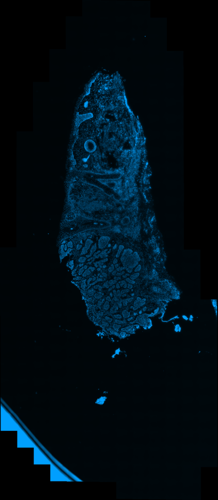

In [10]:
thumbnail(pil_img_dapi1, (500, 500))

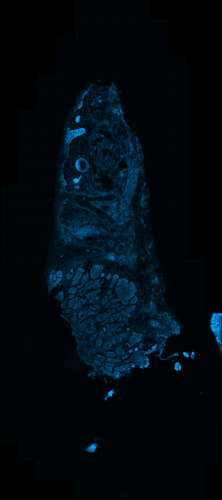

In [11]:
thumbnail(pil_img_dapi2, (500, 500))

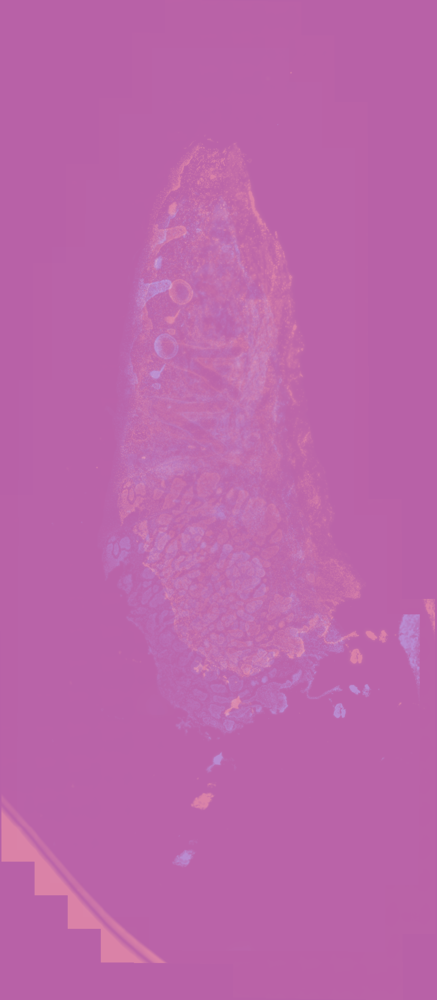

In [10]:
initial_transform = sitk.CenteredTransformInitializer(fixed_img, moving_img, sitk.Euler2DTransform(), sitk.CenteredTransformInitializerFilter.GEOMETRY)

moving_resampled = sitk.Resample(moving_img, fixed_img, initial_transform, sitk.sitkLinear, 0.0, moving_img.GetPixelID())

moving_rgb = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, initial_transform)
thumbnail(show_alignment(pil_img_dapi1, moving_rgb, prefilter = True))

In [11]:
calculate_mutual_info(np.array(dapi1_gray), np.array(get_pil_from_itk(moving_resampled)))

0.20768385732963932

## Affine + B-Spline Registration

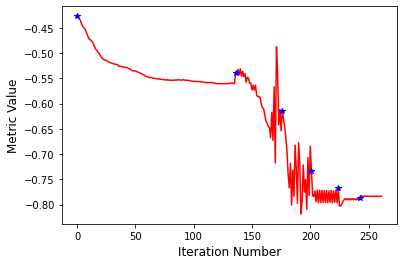

Affine metric value: -0.7845148209503706
Affine Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 19.


In [13]:
initial_transform = sitk.CenteredTransformInitializer(fixed_img, moving_img, sitk.Euler2DTransform(), 
                                                      sitk.CenteredTransformInitializerFilter.GEOMETRY)
affine_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
affine_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=75)
affine_method.SetMetricSamplingStrategy(affine_method.RANDOM)
affine_method.SetMetricSamplingPercentage(0.15)

affine_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
affine_method.SetOptimizerAsGradientDescent(learningRate=1, numberOfIterations=300, convergenceMinimumValue=1e-6, convergenceWindowSize=20)
affine_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.      
# registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [16,8,4,2,1])
# registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[10,4,2,1,0])
affine_method.SetShrinkFactorsPerLevel(shrinkFactors = [16,8,4,3,2,1])
affine_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[10,4,3,2,1,0])
affine_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
affine_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
affine_method.AddCommand(sitk.sitkStartEvent, start_plot)
affine_method.AddCommand(sitk.sitkEndEvent, end_plot)
affine_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
affine_method.AddCommand(sitk.sitkIterationEvent, lambda: plot_values(affine_method))

affine_transform = affine_method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                               sitk.Cast(moving_img, sitk.sitkFloat32))

print('Affine metric value: {0}'.format(affine_method.GetMetricValue()))
print('Affine Optimizer\'s stopping condition, {0}'.format(affine_method.GetOptimizerStopConditionDescription()))

In [14]:
moving_resampled_affine = sitk.Resample(moving_img, fixed_img, affine_transform, 
                                 sitk.sitkLinear, 0.0, moving_img.GetPixelID())
calculate_mutual_info(np.array(dapi1_gray), np.array(get_pil_from_itk(moving_resampled_affine)))

0.4746117946363647

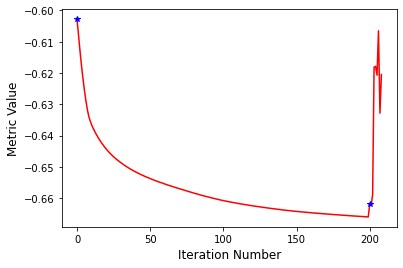

BSpline metric value: -0.5975422125876916
BSpline Optimizer's stopping condition, GradientDescentOptimizerv4Template: Convergence checker passed at iteration 9.


In [15]:
bspline_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
bspline_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
bspline_method.SetMetricSamplingStrategy(bspline_method.RANDOM)
bspline_method.SetMetricSamplingPercentage(0.15)

bspline_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
bspline_method.SetOptimizerAsGradientDescent(learningRate=1, numberOfIterations=200, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
bspline_method.SetOptimizerScalesFromPhysicalShift()

# Setup for the multi-resolution framework.            
bspline_method.SetShrinkFactorsPerLevel(shrinkFactors = [2,1])
bspline_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[1,0])
bspline_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Don't optimize in-place, we would possibly like to run this cell multiple times.
transformDomainMeshSize = [8]*moving_resampled_affine.GetDimension()
initial_transform = sitk.BSplineTransformInitializer(fixed_img, transformDomainMeshSize)
bspline_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
bspline_method.AddCommand(sitk.sitkStartEvent, start_plot)
bspline_method.AddCommand(sitk.sitkEndEvent, end_plot)
bspline_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
bspline_method.AddCommand(sitk.sitkIterationEvent, lambda: plot_values(bspline_method))

bspline_transform = bspline_method.Execute(sitk.Cast(fixed_img, sitk.sitkFloat32), 
                                               sitk.Cast(moving_resampled_affine, sitk.sitkFloat32))

print('BSpline metric value: {0}'.format(bspline_method.GetMetricValue()))
print('BSpline Optimizer\'s stopping condition, {0}'.format(bspline_method.GetOptimizerStopConditionDescription()))

In [16]:
moving_resampled_final_4 = sitk.Resample(moving_resampled_affine, fixed_img, bspline_transform, 
                                 sitk.sitkLinear, 0.0, moving_img.GetPixelID())
calculate_mutual_info(np.array(dapi1_gray), np.array(get_pil_from_itk(moving_resampled_final_4)))

0.4674101647076767

In [17]:
moving_rgb_affine = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, affine_transform)
moving_rgb_final_4 = sitk_transform_rgb(moving_rgb_affine, pil_img_dapi1, bspline_transform)
# thumbnail(show_alignment(he, moving_rgb_final, prefilter = True))
# moving_rgb_final_3 = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, bspline_transform)
print(moving_rgb_final_4.size)
change_color_mv_rgb_final_4 = np.array(moving_rgb_final_4)
print(change_color_mv_rgb_final_4.shape)
foreground = Image.fromarray(cv2.cvtColor(change_color_mv_rgb_final_4, cv2.COLOR_BGR2RGB))
background = pil_img_dapi1

(7859, 17989)
(17989, 7859, 3)


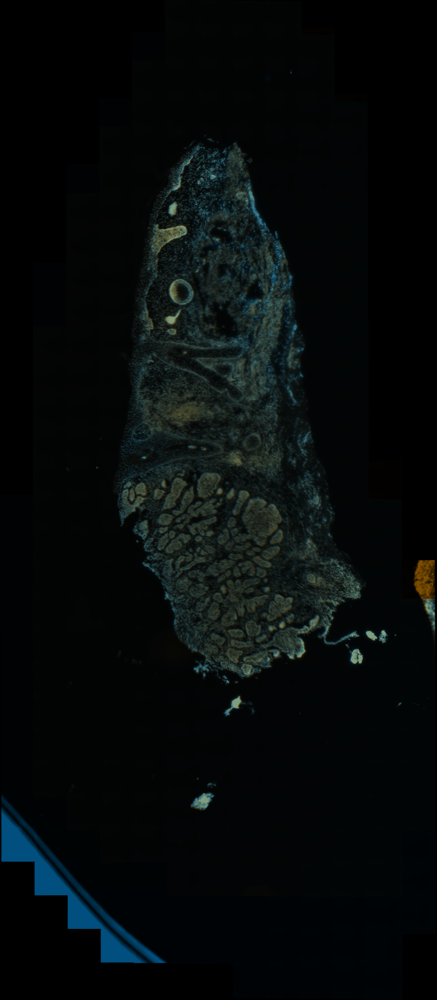

In [19]:
overlayed_imgs_4 = overlay_pil_imgs(background=background, foreground=foreground, alpha=0.5)
thumbnail(overlayed_imgs_4, size = (2000,2000))

In [23]:
print(affine_transform)

itk::simple::Transform
 CompositeTransform (0x56032580a490)
   RTTI typeinfo:   itk::CompositeTransform<double, 2u>
   Reference Count: 1
   Modified Time: 122901991
   Debug: Off
   Object Name: 
   Observers: 
     none
   Transforms in queue, from begin to end:
   >>>>>>>>>
   Euler2DTransform (0x56030b49d420)
     RTTI typeinfo:   itk::Euler2DTransform<double>
     Reference Count: 1
     Modified Time: 122901200
     Debug: Off
     Object Name: 
     Observers: 
       none
     Matrix: 
       0.999991 -0.00429898 
       0.00429898 0.999991 
     Offset: [-558.871, 103.545]
     Center: [3929, 8994]
     Translation: [-597.572, 120.353]
     Inverse: 
       0.999991 0.00429898 
       -0.00429898 0.999991 
     Singular: 0
     Angle       = 0.004299
   End of MultiTransform.
<<<<<<<<<<
   TransformsToOptimizeFlags, begin() to end(): 
      1 
   TransformsToOptimize in queue, from begin to end:
   End of TransformsToOptimizeQueue.
<<<<<<<<<<
   End of CompositeTransform.
<<<<

In [20]:
print(bspline_transform)


itk::simple::Transform
 CompositeTransform (0x5557a0d6a720)
   RTTI typeinfo:   itk::CompositeTransform<double, 2u>
   Reference Count: 1
   Modified Time: 228820312
   Debug: Off
   Object Name: 
   Observers: 
     none
   Transforms in queue, from begin to end:
   >>>>>>>>>
   BSplineTransform (0x555791184ba0)
     RTTI typeinfo:   itk::BSplineTransform<double, 2u, 3u>
     Reference Count: 1
     Modified Time: 228819261
     Debug: Off
     Object Name: 
     Observers: 
       none
     CoefficientImage: [ 0x555790ef5450, 0x55579083c0d0 ]
     TransformDomainOrigin: [-0.625, -0.625]
     TransformDomainPhysicalDimensions: [7859.25, 17989.2]
     TransformDomainDirection: 1 0
0 1

     GridSize: [11, 11]
     GridOrigin: [-983.031, -2249.28]
     GridSpacing: [982.406, 2248.66]
     GridDirection: 1 0
0 1

   End of MultiTransform.
<<<<<<<<<<
   TransformsToOptimizeFlags, begin() to end(): 
      1 
   TransformsToOptimize in queue, from begin to end:
   End of TransformsToOptimiz

In [21]:
sitk.WriteTransform(affine_transform, 'part_1_registration_affine_transform.tfm')

In [22]:
sitk.WriteTransform(bspline_transform, 'part_2_registration_bspline_transform.tfm')

### Load Saved Transform

In [12]:
affine_transform = sitk.ReadTransform('part_1_registration_affine_transform.tfm')
bspline_transform = sitk.ReadTransform('part_2_registration_bspline_transform.tfm')

In [13]:
# verify transform
moving_resampled_affine = sitk.Resample(moving_img, fixed_img, affine_transform, 
                                 sitk.sitkLinear, 0.0, moving_img.GetPixelID())
calculate_mutual_info(np.array(dapi1_gray), np.array(get_pil_from_itk(moving_resampled_affine)))

0.4746117946363647

In [14]:
moving_resampled_final_4 = sitk.Resample(moving_resampled_affine, fixed_img, bspline_transform, 
                                 sitk.sitkLinear, 0.0, moving_img.GetPixelID())
calculate_mutual_info(np.array(dapi1_gray), np.array(get_pil_from_itk(moving_resampled_final_4)))

0.4674101647076767

In [15]:
moving_rgb_affine = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, affine_transform)
moving_rgb_final_4 = sitk_transform_rgb(moving_rgb_affine, pil_img_dapi1, bspline_transform)
# thumbnail(show_alignment(he, moving_rgb_final, prefilter = True))
# moving_rgb_final_3 = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, bspline_transform)
print(moving_rgb_final_4.size)
change_color_mv_rgb_final_4 = np.array(moving_rgb_final_4)
print(change_color_mv_rgb_final_4.shape)
foreground = Image.fromarray(cv2.cvtColor(change_color_mv_rgb_final_4, cv2.COLOR_BGR2RGB))
background = pil_img_dapi1

(7859, 17989)
(17989, 7859, 3)


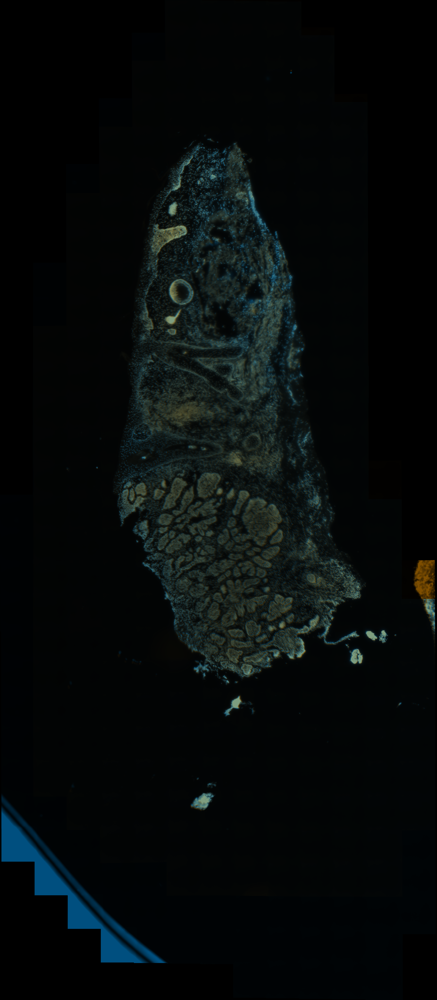

In [16]:
overlayed_imgs_4 = overlay_pil_imgs(background=background, foreground=foreground, alpha=0.5)
thumbnail(overlayed_imgs_4, size = (1000,1000))

In [12]:
scene1_output_dir = os.path.join(qupath_output, 'Scene_1.2')
list_output_files1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files1))
list_output_files1 = np.array(list_output_files1)

6512


In [13]:
all_rects = list()
recorded_parent_boxes = list()
for fn in list_output_files1:
    if 'DAPI' in fn:
        x_coord, y_coord, parent_annots = get_xy_from_fn(fn)
        if parent_annots is not None:
#             pass
#             for index, parent_annot in enumerate(parent_annots):
#                 if parent_annot not in recorded_parent_boxes:
#                     x_par, y_par = parent_annot
#                     annot_x, annot_y = convert_original2scaled(x_par, 
#                                                                y_par, 
#                                                                (img_dapi1.shape[0], img_dapi1.shape[1]),
#                                                                original_czi1_size)
#                     if index == 0:
#                         rect = [annot_x, 
#                                 annot_y, 
#                                 annot_x+int(big_window*img_dapi1.shape[1]),
#                                 annot_y+int(big_window*img_dapi1.shape[0]*0.8)]
#                         all_rects.append(rect)
#                         recorded_parent_boxes.append(parent_annot)
#                     elif index == 1:
#                         rect = [annot_x, 
#                                 annot_y, 
#                                 annot_x+int(medium_window*img_dapi1.shape[1]),
#                                 annot_y+int(medium_window*img_dapi1.shape[0]*0.8)]
#                         all_rects.append(rect)
#                         recorded_parent_boxes.append(parent_annot)
            annot_x, annot_y = convert_original2scaled(x_coord, 
                                                       y_coord, 
                                                       (img_dapi1.shape[0], img_dapi1.shape[1]), 
                                                       original_czi1_size)
            if len(parent_annots) == 1:
                ratio = medium_window
            else:
                ratio = small_window
#             ratio = small_window
            rect = [annot_x, 
                    annot_y, 
                    annot_x+int(ratio*img_dapi1.shape[1]),
                    annot_y+int(ratio*img_dapi1.shape[0]*0.8)]
            all_rects.append(rect)
#         else:
#             annot_x, annot_y = convert_original2scaled(x_coord, 
#                                                        y_coord, 
#                                                        (img_dapi1.shape[0], img_dapi1.shape[1]), 
#                                                        original_czi1_size)
#             rect = [annot_x, 
#                     annot_y, 
#                     annot_x+int(big_window*img_dapi1.shape[1]),
#                     annot_y+int(big_window*img_dapi1.shape[0]*0.8)]
#             all_rects.append(rect)



In [20]:
scene2_output_dir = os.path.join(qupath_output, 'Scene_1_R2.3')
list_output_files2 = get_files_in_dir_recursively(scene2_output_dir)
print(len(list_output_files2))
list_output_files2 = np.array(list_output_files2)

5790


In [44]:
all_rects2 = list()
recorded_parent_boxes2 = list()
for fn in list_output_files2:
    if 'DAPI' in fn:
        x_coord, y_coord, parent_annots = get_xy_from_fn(fn)
        if parent_annots is not None:
#             pass
#             for index, parent_annot in enumerate(parent_annots):
#                 if parent_annot not in recorded_parent_boxes2:
#                     x_par, y_par = parent_annot
#                     annot_x, annot_y = convert_original2scaled(x_par, 
#                                                                y_par, 
#                                                                (img_dapi2.shape[0], img_dapi2.shape[1]),
#                                                                original_czi1_size_s2)
#                     if index == 0:
#                         rect = [annot_x, 
#                                 annot_y, 
#                                 annot_x+int(big_window*img_dapi2.shape[1]),
#                                 annot_y+int(big_window*img_dapi2.shape[0]*0.8)]
#                         all_rects2.append(rect)
#                         recorded_parent_boxes2.append(parent_annot)
#                     elif index == 1:
#                         rect = [annot_x, 
#                                 annot_y, 
#                                 annot_x+int(medium_window*img_dapi2.shape[1]),
#                                 annot_y+int(medium_window*img_dapi2.shape[0]*0.8)]
#                         all_rects2.append(rect)
#                         recorded_parent_boxes2.append(parent_annot)
            annot_x, annot_y = convert_original2scaled(x_coord, 
                                                       y_coord, 
                                                       (img_dapi2.shape[0], img_dapi2.shape[1]), 
                                                       original_czi1_size_s2)
            if len(parent_annots) == 1:
                ratio = medium_window
            else:
                ratio = small_window
#             ratio = small_window
            rect = [annot_x, 
                    annot_y, 
                    annot_x+int(ratio*img_dapi1.shape[1]),
                    annot_y+int(ratio*img_dapi1.shape[0]*0.8)]
            all_rects2.append(rect)
#         else:
#             annot_x, annot_y = convert_original2scaled(x_coord, 
#                                                        y_coord, 
#                                                        (img_dapi2.shape[0], img_dapi2.shape[1]), 
#                                                        original_czi1_size_s2)
#             rect = [annot_x, 
#                     annot_y, 
#                     annot_x+int(big_window*img_dapi2.shape[1]),
#                     annot_y+int(big_window*img_dapi2.shape[0]*0.8)]
#             all_rects2.append(rect)



1625


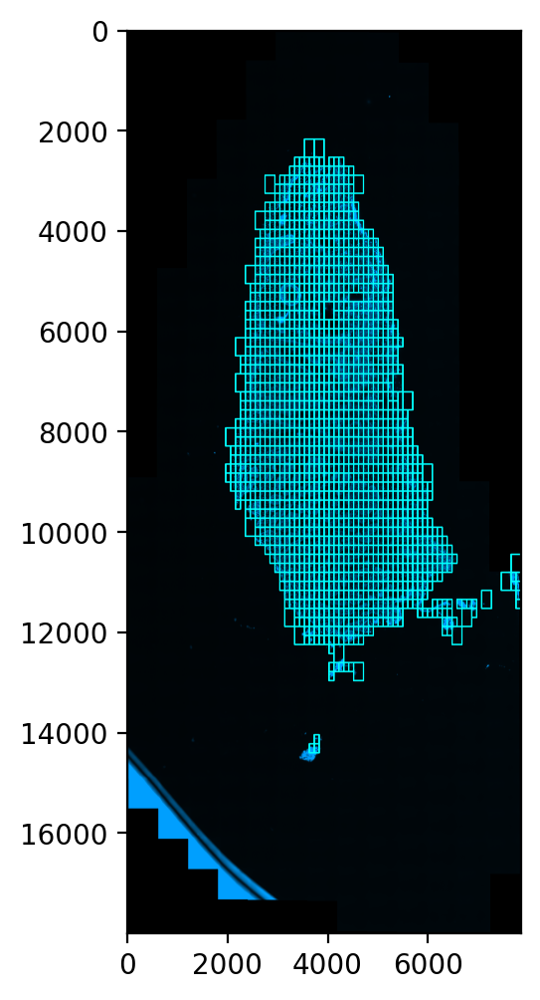

In [14]:
demo_image = draw_rectangles(img_dapi1, all_rects, thickness=30)
print(len(all_rects))
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.imshow(demo_image, vmax=255, vmin=0)
# plt.savefig('All_annotation_visualize')

1927


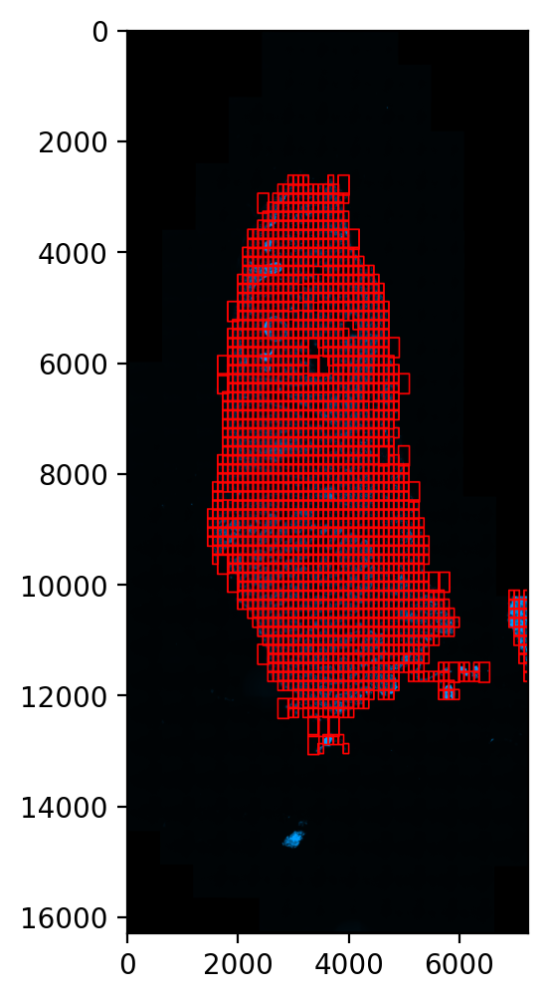

In [48]:
demo_image2 = draw_rectangles(img_dapi2, all_rects2, color=[255, 0, 0], thickness=30)
print(len(all_rects2))
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.imshow(demo_image2, vmax=255, vmin=0)
# plt.savefig('All_annotation_visualize')

(7859, 17989)
(17989, 7859, 3)


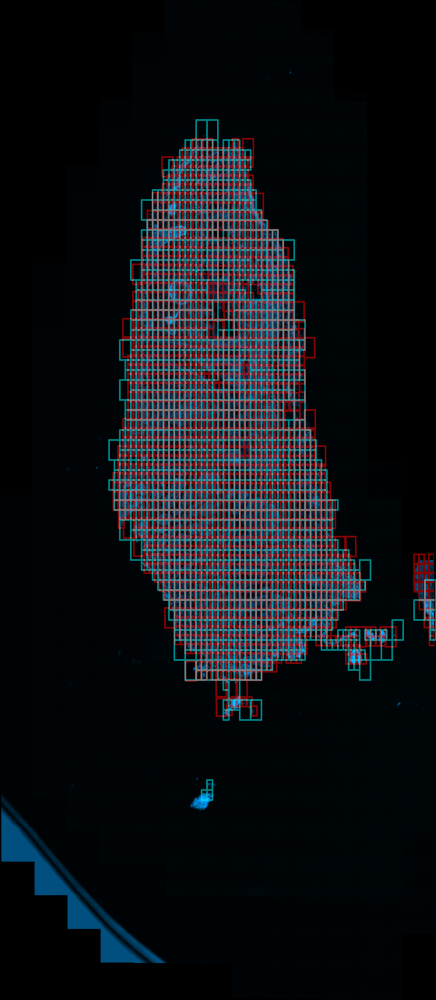

In [49]:
annotated_1 = Image.fromarray(demo_image)
annotated_2 = Image.fromarray(demo_image2)

moving_annot_affine = sitk_transform_rgb(annotated_2, annotated_1, affine_transform)
moving_annot_final = sitk_transform_rgb(moving_annot_affine, annotated_1, bspline_transform)
# thumbnail(show_alignment(he, moving_rgb_final, prefilter = True))
# moving_rgb_final_3 = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, bspline_transform)
print(moving_annot_final.size)
change_moving_annot_final = np.array(moving_annot_final)
print(change_moving_annot_final.shape)
foreground = Image.fromarray(change_moving_annot_final)
background = annotated_1

overlayed_annot = overlay_pil_imgs(background=background, foreground=foreground, alpha=0.5)
thumbnail(overlayed_annot, size = (1500,1500))

In [62]:
scene1_output_dir = os.path.join(qupath_output, 'Scene_1.2')
list_output_files1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files1))
list_output_files1 = np.array(list_output_files1)

6512


In [15]:
all_collocalized_rects = list()

box_collocalized_scores = list()
child_count = dict()

for fn in list_output_files1:
    if 'DAPI' in fn:
        x_coord, y_coord, parent_annots = get_xy_from_fn(fn)
        if parent_annots is not None:
            for index, parent_annot in enumerate(parent_annots):
                if child_count.get('_'.join(str(i) for i in parent_annot), None) is None:
                    
                    x_par, y_par = parent_annot
                    annot_x, annot_y = convert_original2scaled(x_par, y_par, 
                                                               (img_dapi1.shape[0], img_dapi1.shape[1]), 
                                                               original_czi1_size)
                    if index == 0:
                        par_rect = [annot_x, 
                                    annot_y, 
                                    annot_x+int(big_window*img_dapi1.shape[1]),
                                    annot_y+int(big_window*img_dapi1.shape[0]*0.8)]
                    elif index == 1:
                        par_rect = [annot_x, 
                                    annot_y, 
                                    annot_x+int(medium_window*img_dapi1.shape[1]),
                                    annot_y+int(medium_window*img_dapi1.shape[0]*0.8)]
                    all_collocalized_rects.append(par_rect)
#                     score = collocalize_score(fn)
                    child_count['_'.join(str(i) for i in parent_annot)] = 1
                    box_collocalized_scores.append(0)

                else:
                    child_count['_'.join(str(i) for i in parent_annot)] += 1
                    annot_x, annot_y = convert_original2scaled(x_coord, y_coord, 
                                                               (img_dapi1.shape[0], img_dapi1.shape[1]), 
                                                               original_czi1_size)
                    if len(parent_annots) == 1:
                        ratio = medium_window
                    elif len(parent_annots) == 2:
                        ratio = small_window
                    rect = [annot_x, 
                            annot_y, 
                            annot_x+int(ratio*img_dapi1.shape[1]),
                            annot_y+int(ratio*img_dapi1.shape[0]*0.8)]
                    all_collocalized_rects.append(rect)
                    score = collocalize_score(fn)
#                     if score > 4:
#                         print(score, rect)
#                         print(fn)
                    box_collocalized_scores.append(normalize_score_by_rect(score, rect))
        else:
            annot_x, annot_y = convert_original2scaled(x_coord, y_coord, 
                                                       (img_dapi1.shape[0], img_dapi1.shape[1]), 
                                                       original_czi1_size)
            rect = [annot_x, 
                    annot_y, 
                    annot_x+int(big_window*img_dapi1.shape[1]),
                    annot_y+int(big_window*img_dapi1.shape[0]*0.8)]
            all_collocalized_rects.append(rect)
#             score = collocalize_score(fn)
            box_collocalized_scores.append(0)


box_collocalized_scores = np.array(box_collocalized_scores)
# std_scaler = StandardScaler()
# stded_box_score = std_scaler.fit_transform(box_collocalized_scores.reshape(-1,1))
# print(stded_box_score.mean(), stded_box_score.std())
# print(stded_box_score.reshape(box_collocalized_scores.shape))
heat_colors = np.array(map_heat_values2colors(box_collocalized_scores))
# print(heat_colors[10:25])
heat_colors = heat_colors * 255
# print(heat_colors[10:25])
heat_demo_image = draw_rectangles_heat(np.zeros_like(img_dapi1), all_collocalized_rects, heat_colors, box_collocalized_scores)



0.0 4.0


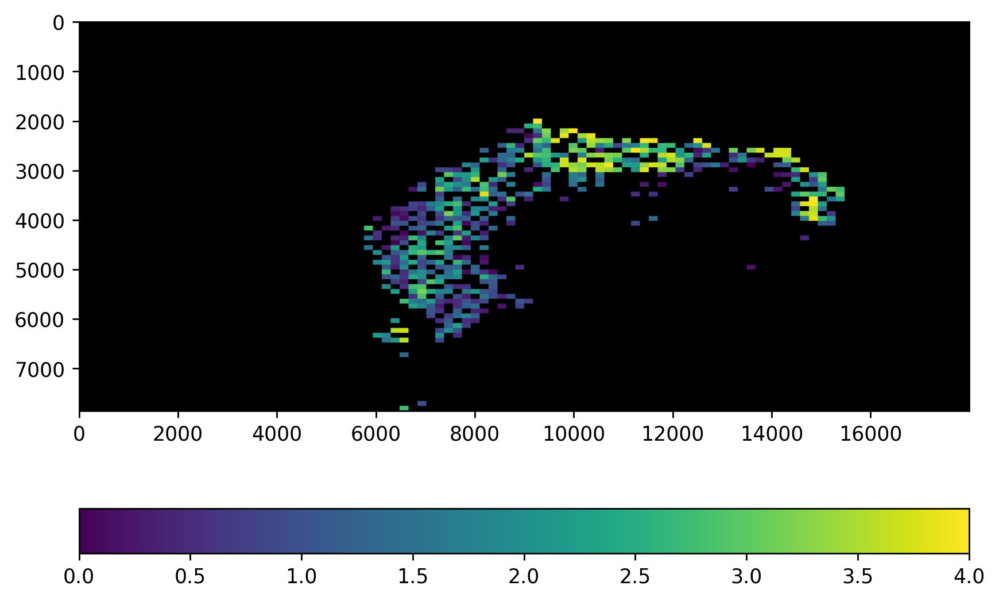

In [16]:
print(box_collocalized_scores.min(), box_collocalized_scores.max())
rotated_heat_demo_image = rotate(heat_demo_image, -90, resize=True)

plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(rotated_heat_demo_image, vmax=box_collocalized_scores.min(), vmin=box_collocalized_scores.max())
plt.colorbar(orientation='horizontal')
plt.savefig('Fig1d_heatmap_scene1_IL34_CSF1R.jpg')


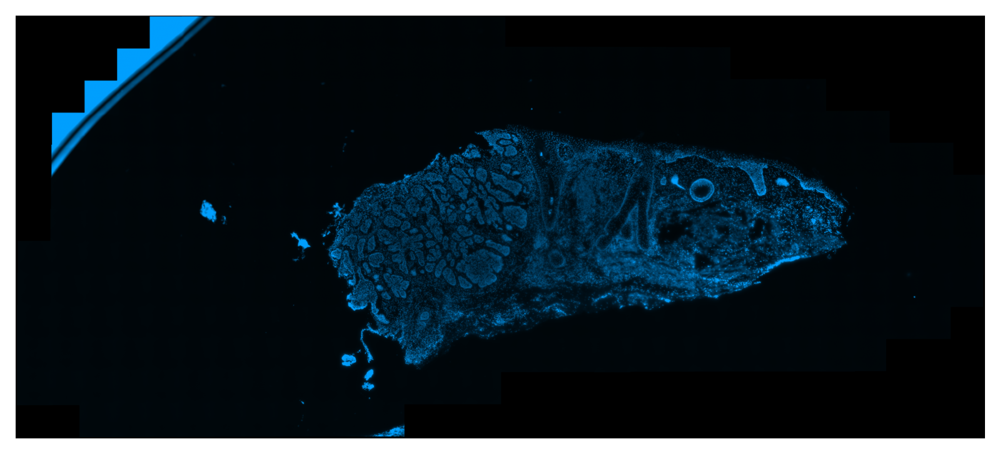

In [17]:
rotated_dapi1 = rotate(img_dapi1, -90, resize=True)
plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(rotated_dapi1)
# plt.colorbar()
plt.axis('off')
plt.savefig('rotated_dapi_scene1.pdf')

### Draw contour line


In [18]:
# from skimage.data import astronaut
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

In [19]:
all_rects.sort(key=x_element)
select_rects = all_rects[:-10]
select_rects.sort(key=y_element)
select_rects = select_rects[:-15]
select_rects.sort(key=xy_element)
select_rects = select_rects[:-5]

1595


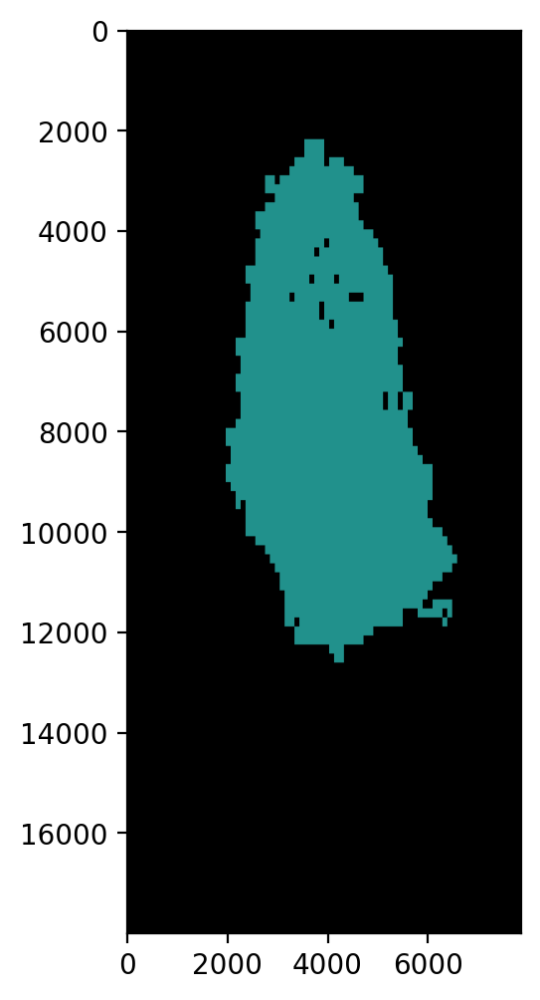

In [20]:
mask_dapi = np.zeros_like(img_dapi1)

box_collocalized_scores_2 = list()
for rect in select_rects:
    box_collocalized_scores_2.append(2)

mask_colors = np.array(map_heat_values2colors(box_collocalized_scores_2))
# print(heat_colors[10:25])
mask_colors = mask_colors * 255

mask_by_dapi = draw_rectangles_heat(mask_dapi, select_rects, mask_colors, box_collocalized_scores_2)
print(len(select_rects))
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.imshow(mask_by_dapi, vmax=255, vmin=0)
# plt.savefig('All_annotation_visualize')

In [21]:
# Find contours at a constant value of 0.8
from skimage import measure
gray_all = cv2.cvtColor(mask_by_dapi, cv2.COLOR_RGB2GRAY)
contours = measure.find_contours(gray_all, 0.8)

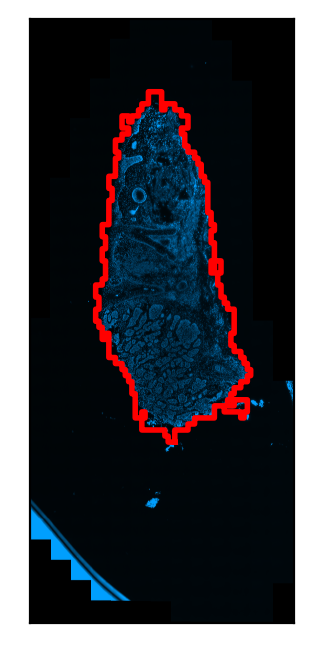

<Figure size 432x288 with 0 Axes>

In [22]:
fig, ax = plt.subplots(dpi=200)
# ax.imshow(np.zeros_like(mask_by_dapi), cmap=plt.cm.gray)
ax.imshow(img_dapi1,cmap=plt.cm.gray)

for n, contour in enumerate(contours[0:1]):
    ax.plot(contour[:, 1], contour[:, 0], 'r',linewidth=2)

ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()
plt.savefig('contour_over_dapi_scene1.pdf')

In [23]:
from scipy import ndimage as ndi
mask_binary = np.zeros_like(cv2.cvtColor(mask_by_dapi, cv2.COLOR_RGB2GRAY))
mask_binary[np.round(contours[0][:, 0]).astype('int'), np.round(contours[0][:, 1]).astype('int')] = 1
fill_contour = ndi.binary_fill_holes(mask_binary)
fill_contour = fill_contour.astype('int')
# plt.imshow(np.array(fill_contour), cmap='gray')

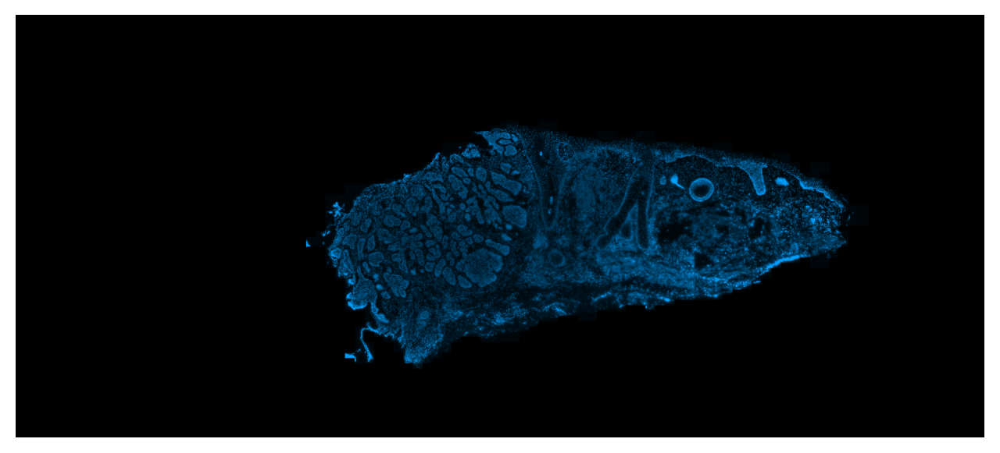

In [24]:
masked_all = cv2.bitwise_and(img_dapi1, img_dapi1, mask=np.array(fill_contour.astype('uint8')))
rotated_masked = rotate(masked_all, -90, resize=True)
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.axis('off')
plt.imshow(rotated_masked)
plt.savefig('cropped_rotated_dapi_scene1.pdf')

In [25]:
rotated_masked_gray = rgb2gray(rotated_masked)
print(rotated_masked.shape, rotated_masked.min(), rotated_masked.max())
print(rotated_masked_gray.min(), rotated_masked_gray.max())

(7859, 17989, 3) 0.0 0.996078431372549
0.0 0.5178901960784315


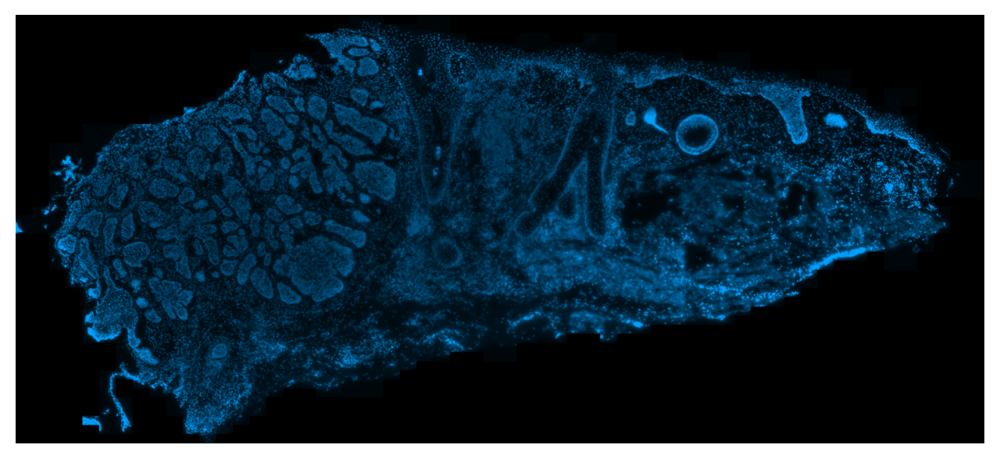

In [26]:
mask = rgb2gray(rotated_masked) > 0
# thumbnail(Image.fromarray(np.array(rotated_masked.astype('uint8'))))
# Coordinates of non-black pixels.
coords = np.argwhere(mask)
# print(len(coords))
# 1/0
# # Bounding box of non-black pixels.
x0, y0 = coords.min(axis=0)
x1, y1 = coords.max(axis=0) + 1   # slices are exclusive at the top

# # Get the contents of the bounding box.
cropped = rotated_masked[x0:x1, y0:y1, :]
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.axis('off')
plt.imshow(cropped)
plt.savefig('centered_cropped_rotated_dapi_scene1.pdf')

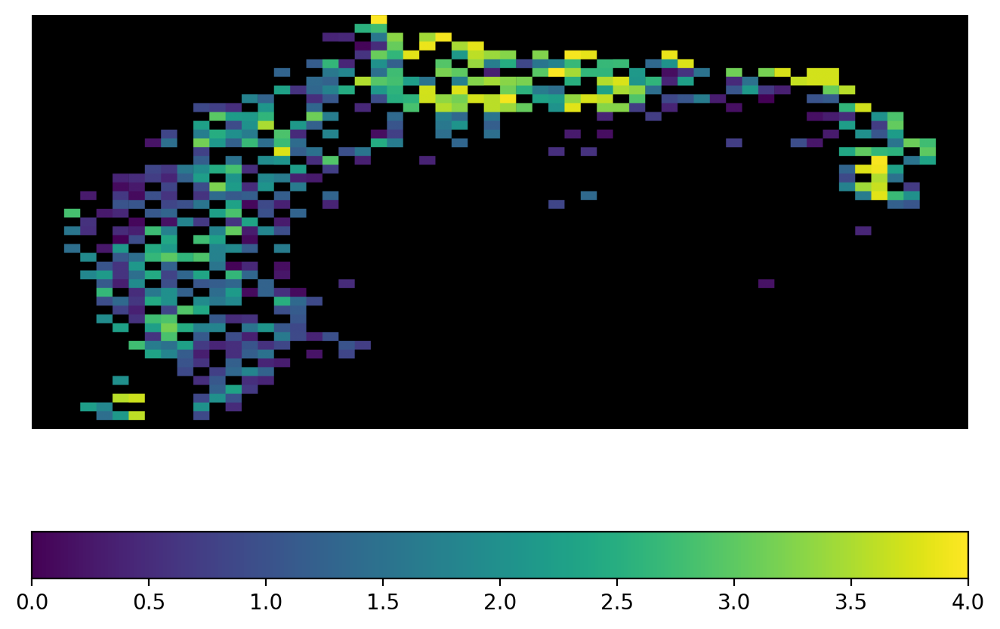

In [31]:
cropped_rotated_heat_demo_image = rotated_heat_demo_image[x0:x1, y0:y1, :]
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.axis('off')

plt.imshow(cropped_rotated_heat_demo_image, vmax=box_collocalized_scores.min(), vmin=box_collocalized_scores.max())
plt.colorbar(orientation='horizontal')
plt.savefig('Fig1d_cropped_heatmap_scene_1.jpg')

In [41]:
total_area1 = 0
print(len(all_rects))
for rect in select_rects[0:1500]:
    area = area_of_rect(rect)
    total_area1 += area
print(total_area1)
full_area1 = original_czi1_size[0]*original_czi1_size[1]
mu_area1 = mu_metric1_s1[0] *  mu_metric1_s1[1]
tissue_area_r1 = total_area1 * mu_area1 / full_area1
print(tissue_area_r1)

1625
27158152
683788.1663510128


In [70]:
all_rects2.sort(key=x_element)
select_rects2 = all_rects2[:-5]
select_rects2.sort(key=y_element)
select_rects2 = select_rects2[:-30]
select_rects2.sort(key=xy_element)
select_rects2 = select_rects2[:-15]


(16279, 7244, 3)
1877 (16279, 7244, 3)


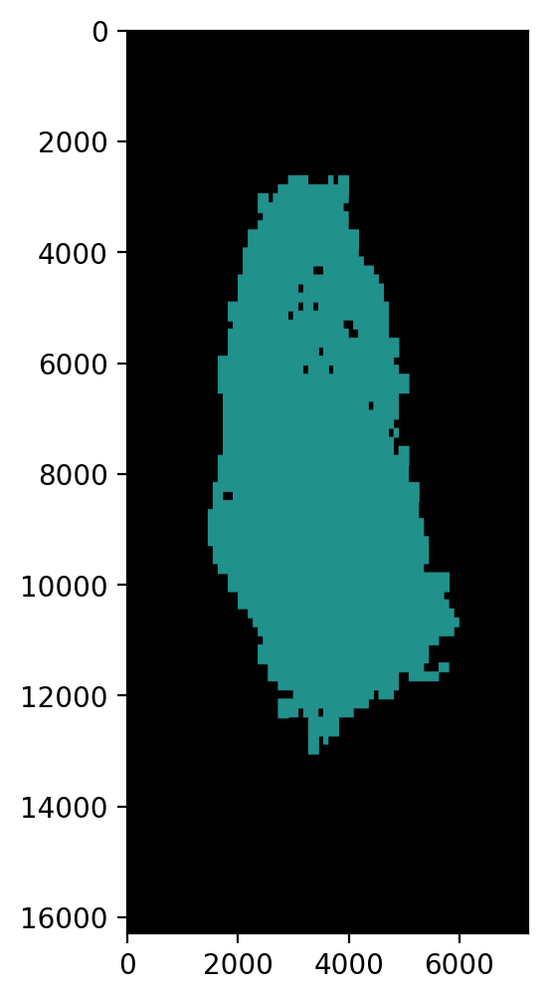

In [89]:
mask_dapi2 = np.zeros_like(img_dapi2)
print(img_dapi2.shape)
box_collocalized_scores_2 = list()
for rect in select_rects2:
    box_collocalized_scores_2.append(2)

mask_colors = np.array(map_heat_values2colors(box_collocalized_scores_2))
# print(heat_colors[10:25])
mask_colors = mask_colors * 255

mask_by_dapi2 = draw_rectangles_heat(mask_dapi2, select_rects2, mask_colors, box_collocalized_scores_2)
print(len(select_rects2), mask_by_dapi2.shape)
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.imshow(mask_by_dapi2, vmax=255, vmin=0)
# plt.savefig('All_annotation_visualize')

In [90]:
gray_all2 = cv2.cvtColor(mask_by_dapi2, cv2.COLOR_RGB2GRAY)
contours2 = measure.find_contours(gray_all2, 0.8)
print(gray_all2.shape)

(16279, 7244)


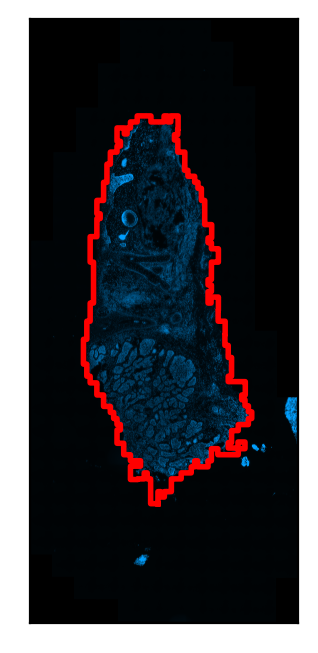

<Figure size 432x288 with 0 Axes>

In [73]:
fig, ax = plt.subplots(dpi=200)
# ax.imshow(np.zeros_like(mask_by_dapi), cmap=plt.cm.gray)
ax.imshow(img_dapi2,cmap=plt.cm.gray)

for n, contour in enumerate(contours2[0:1]):
    ax.plot(contour[:, 1], contour[:, 0], 'r',linewidth=2)

ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()
plt.savefig('contour_over_dapi_scene1_R2.pdf')

In [91]:
mask_binary2 = np.zeros_like(cv2.cvtColor(mask_by_dapi2, cv2.COLOR_RGB2GRAY))
mask_binary2[np.round(contours2[0][:, 0]).astype('int'), np.round(contours2[0][:, 1]).astype('int')] = 1
fill_contour2 = ndi.binary_fill_holes(mask_binary2)
fill_contour2 = fill_contour2.astype('int')

(16279, 7244) (16279, 7244, 3) (16279, 7244, 3)


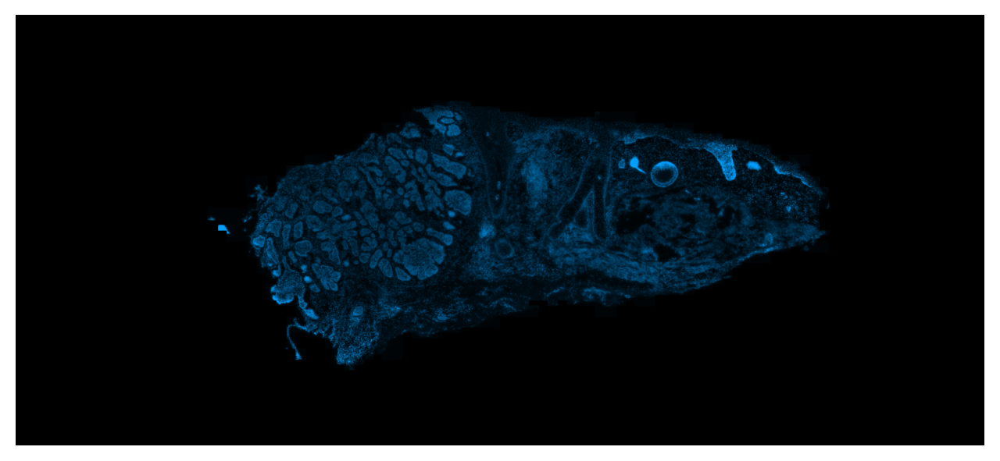

In [92]:
# plt.imshow(np.array(fill_contour2), cmap='gray')
print(fill_contour2.shape, img_dapi2.shape, mask_by_dapi2.shape)
masked_all2 = cv2.bitwise_and(img_dapi2, img_dapi2, mask=np.array(fill_contour2.astype('uint8')))
rotated_masked2 = rotate(masked_all2, -90, resize=True)
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.axis('off')
plt.imshow(rotated_masked2)
plt.savefig('cropped_rotated_dapi_scene1_R2.pdf')

In [86]:
print(fill_contour2.shape, img_dapi2.shape, mask_by_dapi2.shape)

(17989, 7859) (16279, 7244, 3) (17989, 7859, 3)


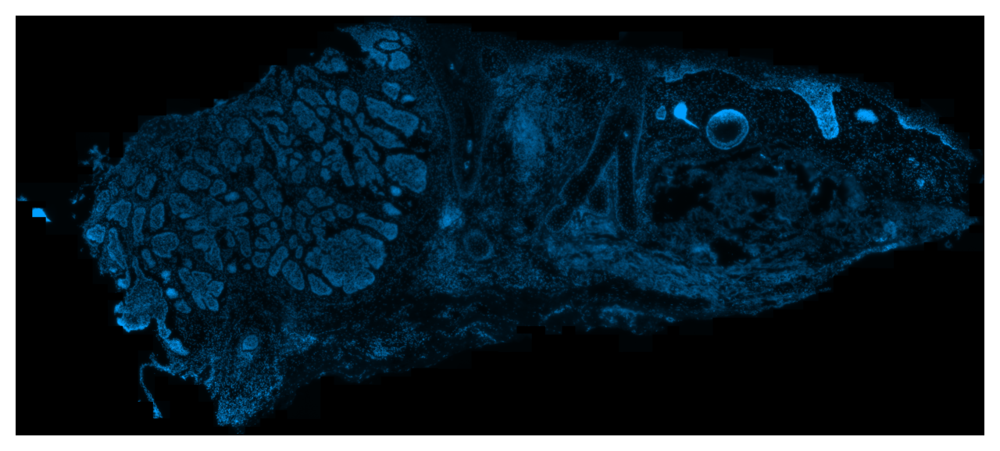

In [93]:
# masked_all2 = cv2.bitwise_and(img_dapi2, img_dapi2, mask=np.array(fill_contour2.astype('uint8')))
# rotated_masked2 = rotate(masked_all2, -90, resize=True)
mask2 = rgb2gray(rotated_masked2) > 0
# thumbnail(Image.fromarray(np.array(rotated_masked.astype('uint8'))))
# Coordinates of non-black pixels.
coords2 = np.argwhere(mask2)
# print(len(coords))
# 1/0
# # Bounding box of non-black pixels.
x0, y0 = coords2.min(axis=0)
x1, y1 = coords2.max(axis=0) + 1   # slices are exclusive at the top

# # Get the contents of the bounding box.
cropped2 = rotated_masked2[x0:x1, y0:y1, :]
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.axis('off')
plt.imshow(cropped2)
plt.savefig('centered_cropped_rotated_dapi_scene1_R2.pdf')

In [44]:
total_area2 = 0
print(len(select_rects2))
for rect in select_rects2[0:1610]:
    area = area_of_rect(rect)
    total_area2 += area
print(total_area2)
full_area2 = original_czi1_size_s2[0]*original_czi1_size_s2[1]
mu_area2 = mu_metric1_s2[0] *  mu_metric1_s2[1]
tissue_area_r2 = total_area2 * mu_area2 / full_area2
print(tissue_area_r2, tissue_area_r1)

1887
28982128
860782.8479925934 683788.1663510128


#### Barplot for gene count

In [47]:
test_json = list_output_files1[1000]
print(test_json)
df_json2 = convert_json2dataframe(test_json)
col_names = df_json2.columns

/QRISdata/Q1851/Minh/RNAScope/QuPath_project_1/Scene_1.2/Cy5/x11905_y34888/x12500_y34888/measurement_values_Cy5_annot_block_x12797_y34888.json


In [ ]:
# // Thy1, NM_001311160.2, T2 channel -> Cy3  (orange)
# // IL34, NM_001172771.2, T3 channel -> Cy5 (far red)
# // CSF1R, NM_001288705.2, T4 channel -> Cy7 (near Infrared)
scene1_output_dir = os.path.join(qupath_output, 'Scene_1')
list_output_files_s1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files_s1))
list_output_files_s1 = np.array(list_output_files_s1)
s1_cy3 = list()
s1_cy5 = list()
s1_cy7 = list()
s1_dapi = list()
# Nucleus: DAPI mean
for fn in list_output_files_s1:
    if 'Cy3' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy3.extend(df_json['Cell: Cy3 mean'].tolist())
    elif 'Cy5' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy5.extend(df_json['Cell: Cy5 mean'].tolist())
    elif 'Cy7' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy7.extend(df_json['Cell: Cy7 mean'].tolist())
    elif 'DAPI' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_dapi.extend(df_json['Nucleus: DAPI mean'].tolist())
print(len(s1_cy3), len(s1_cy5), len(s1_cy7), len(s1_dapi))


In [25]:
# // Thy1, NM_001311160.2, T2 channel -> Cy3  (orange)
# // IL34, NM_001172771.2, T3 channel -> Cy5 (far red)
# // CSF1R, NM_001288705.2, T4 channel -> Cy7 (near Infrared)
scene1_output_dir = os.path.join(qupath_output, 'Scene_1.1')
list_output_files_s1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files_s1))
list_output_files_s1 = np.array(list_output_files_s1)
s1_cy3 = list()
s1_cy5 = list()
s1_cy7 = list()
s1_dapi = list()
# Nucleus: DAPI mean
for fn in list_output_files_s1:
    if 'Cy3' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy3.extend(df_json['Cell: Cy3 mean'].tolist())
    elif 'Cy5' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy5.extend(df_json['Cell: Cy5 mean'].tolist())
    elif 'Cy7' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy7.extend(df_json['Cell: Cy7 mean'].tolist())
    elif 'DAPI' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_dapi.extend(df_json['Nucleus: DAPI mean'].tolist())
print(len(s1_cy3), len(s1_cy5), len(s1_cy7), len(s1_dapi))

6224
17906 6160 7284 30782


In [26]:
# // Thy1, NM_001311160.2, T2 channel -> Cy3  (orange)
# // IL34, NM_001172771.2, T3 channel -> Cy5 (far red)
# // CSF1R, NM_001288705.2, T4 channel -> Cy7 (near Infrared)
scene1_output_dir = os.path.join(qupath_output, 'Scene_1.2')
list_output_files_s1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files_s1))
list_output_files_s1 = np.array(list_output_files_s1)
s1_cy3 = list()
s1_cy5 = list()
s1_cy7 = list()
s1_dapi = list()
# Nucleus: DAPI mean
for fn in list_output_files_s1:
    if 'Cy3' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy3.extend(df_json['Cell: Cy3 mean'].tolist())
    elif 'Cy5' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy5.extend(df_json['Cell: Cy5 mean'].tolist())
    elif 'Cy7' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy7.extend(df_json['Cell: Cy7 mean'].tolist())
    elif 'DAPI' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_dapi.extend(df_json['Nucleus: DAPI mean'].tolist())
print(len(s1_cy3), len(s1_cy5), len(s1_cy7), len(s1_dapi))

6512
11477 5120 6551 37177


In [27]:
scene1_output_dir2 = os.path.join(qupath_output, 'Scene_1_R2')
list_output_files_s2 = get_files_in_dir_recursively(scene1_output_dir2)
print(len(list_output_files_s2))
list_output_files_s2 = np.array(list_output_files_s2)
# s1_cy3 = list()
s1_cy5_r2 = list()
s1_cy7_r2 = list()
s1_dapi_r2 = list()
# Nucleus: DAPI mean
for fn in list_output_files_s2:
    if 'Cy7' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy7_r2.extend(df_json['Cell: Cy7 mean'].tolist())
    elif 'Cy5' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy5_r2.extend(df_json['Cell: Cy5 mean'].tolist())
    elif 'DAPI' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_dapi_r2.extend(df_json['Nucleus: DAPI mean'].tolist())
print(len(s1_cy5_r2), len(s1_cy7_r2), len(s1_dapi_r2))

5022
31283 9082 20804


In [28]:
scene1_output_dir2 = os.path.join(qupath_output, 'Scene_1_R2.1')
list_output_files_s2 = get_files_in_dir_recursively(scene1_output_dir2)
print(len(list_output_files_s2))
list_output_files_s2 = np.array(list_output_files_s2)
# s1_cy3 = list()
s1_cy5_r2 = list()
s1_cy7_r2 = list()
s1_dapi_r2 = list()
# Nucleus: DAPI mean
for fn in list_output_files_s2:
    if 'Cy7' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy7_r2.extend(df_json['Cell: Cy7 mean'].tolist())
    elif 'Cy5' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy5_r2.extend(df_json['Cell: Cy5 mean'].tolist())
    elif 'DAPI' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_dapi_r2.extend(df_json['Nucleus: DAPI mean'].tolist())
print(len(s1_cy5_r2), len(s1_cy7_r2), len(s1_dapi_r2))

5022
2832 2460 20804


In [29]:
scene1_output_dir2 = os.path.join(qupath_output, 'Scene_1_R2.2')
list_output_files_s2 = get_files_in_dir_recursively(scene1_output_dir2)
print(len(list_output_files_s2))
list_output_files_s2 = np.array(list_output_files_s2)
# s1_cy3 = list()
s1_cy5_r2 = list()
s1_cy7_r2 = list()
s1_dapi_r2 = list()
# Nucleus: DAPI mean
for fn in list_output_files_s2:
    if 'Cy7' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy7_r2.extend(df_json['Cell: Cy7 mean'].tolist())
    elif 'Cy5' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy5_r2.extend(df_json['Cell: Cy5 mean'].tolist())
    elif 'DAPI' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_dapi_r2.extend(df_json['Nucleus: DAPI mean'].tolist())
print(len(s1_cy5_r2), len(s1_cy7_r2), len(s1_dapi_r2))

5826
2508 2032 32653


In [48]:
scene1_output_dir2 = os.path.join(qupath_output, 'Scene_1_R2.3')
list_output_files_s2 = get_files_in_dir_recursively(scene1_output_dir2)
print(len(list_output_files_s2))
list_output_files_s2 = np.array(list_output_files_s2)
# s1_cy3 = list()
s1_cy5_r2 = list()
s1_cy7_r2 = list()
s1_dapi_r2 = list()
# Nucleus: DAPI mean
for fn in list_output_files_s2:
    if 'Cy7' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy7_r2.extend(df_json['Cell: Cy7 mean'].tolist())
    elif 'Cy5' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_cy5_r2.extend(df_json['Cell: Cy5 mean'].tolist())
    elif 'DAPI' in fn:
        df_json = convert_json2dataframe(fn, col_names)
        s1_dapi_r2.extend(df_json['Nucleus: DAPI mean'].tolist())
print(len(s1_cy5_r2), len(s1_cy7_r2), len(s1_dapi_r2))

5790
2458 2027 31769


In [37]:
# tissue area in micron meter
# to = 690508.7054050169

count_thy1 = len(s1_cy3)
count_csf1r = len(s1_cy7)
count_il34 = len(s1_cy5)
count_dapi1 = len(s1_dapi)
count_itgam = len(s1_cy7_r2)
count_cd207 = len(s1_cy5_r2)
count_dapi2 = len(s1_dapi_r2)
norm_thy1 = count_thy1#/662508.9225951087
norm_csf1r = count_csf1r#/662508.9225951087
norm_il34 = count_il34#/662508.9225951087
norm_itgam = count_itgam#/662508.9225951087
norm_cd207 = count_cd207#/662508.9225951087
norm_dapi1 = count_dapi1#/662508.9225951087
norm_dapi2 = count_dapi2#/662508.9225951087
print(len(s1_cy5_r2), len(s1_cy7_r2), len(s1_dapi_r2))
print(count_cd207, count_itgam, len(s1_dapi_r2))

2508 2032 32653
2508 2032 32653


(11477, 6551, 5120, 2508, 2032)


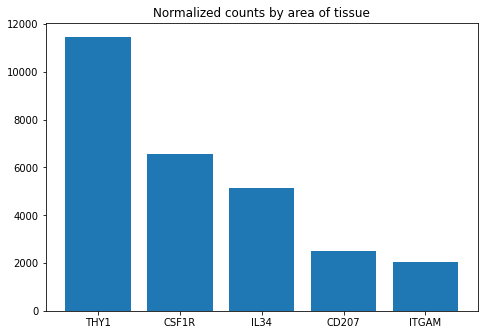

<Figure size 432x288 with 0 Axes>

In [40]:
# scene1_values = (norm_thy1, norm_csf1r, norm_il34, norm_cd207,norm_itgam)#, norm_dapi1, norm_dapi2)
# scene2_values = (mean_s2_cy5, mean_s2_cy5, mean_s3_cy5, mean_s4_cy5)
# scene3_values = (mean_s1_cy7, mean_s2_cy7, mean_s3_cy7, mean_s4_cy7)
print(scene1_values)
# print(scene2_values)
# print(scene3_values)
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
markers = ['THY1', 'CSF1R', 'IL34', 'CD207',  'ITGAM' ]#, 'DAPI_R1', 'DAPI_R2']
scene1_values = (norm_thy1, norm_csf1r, norm_il34, norm_cd207, norm_itgam)#, norm_dapi1, norm_dapi2)
ax.bar(markers,scene1_values)
ax.set_title('Normalized counts by area of tissue')
plt.show()
plt.savefig('Barplot_marker_detection_normalized_area.pdf')

## Heatmap for THY1, ITGAM, CD207

### Heatmap ITGAM and CD207

In [94]:
# check the ITGAM, CD207 
scene1_output_dir2 = os.path.join(qupath_output, 'Scene_1_R2.3')
list_output_files_s2 = get_files_in_dir_recursively(scene1_output_dir2)
all_collocalized_rects_s2 = list()

box_collocalized_scores_s2 = list()
child_count_s2 = dict()

for fn in list_output_files_s2:
    if 'DAPI' in fn:
        x_coord, y_coord, parent_annots = get_xy_from_fn(fn)
        if parent_annots is not None:
            for index, parent_annot in enumerate(parent_annots):
                if child_count_s2.get('_'.join(str(i) for i in parent_annot), None) is None:
                    
                    x_par, y_par = parent_annot
                    annot_x, annot_y = convert_original2scaled(x_par, y_par, 
                                                               (img_dapi2.shape[0], img_dapi2.shape[1]), 
                                                               original_czi1_size_s2)
                    if index == 0:
                        par_rect = [annot_x, 
                                    annot_y, 
                                    annot_x+int(big_window*img_dapi2.shape[1]),
                                    annot_y+int(big_window*img_dapi2.shape[0]*0.8)]
                    elif index == 1:
                        par_rect = [annot_x, 
                                    annot_y, 
                                    annot_x+int(medium_window*img_dapi2.shape[1]),
                                    annot_y+int(medium_window*img_dapi2.shape[0]*0.8)]
                    all_collocalized_rects_s2.append(par_rect)
#                     score = collocalize_score(fn)
                    child_count_s2['_'.join(str(i) for i in parent_annot)] = 1
                    box_collocalized_scores_s2.append(0)

                else:
                    child_count_s2['_'.join(str(i) for i in parent_annot)] += 1
                    annot_x, annot_y = convert_original2scaled(x_coord, y_coord, 
                                                               (img_dapi2.shape[0], img_dapi2.shape[1]), 
                                                               original_czi1_size_s2)
                    if len(parent_annots) == 1:
                        ratio = medium_window
                    elif len(parent_annots) == 2:
                        ratio = small_window
                    rect = [annot_x, 
                            annot_y, 
                            annot_x+int(ratio*img_dapi1.shape[1]),
                            annot_y+int(ratio*img_dapi1.shape[0]*0.8)]
                    all_collocalized_rects_s2.append(rect)
                    score = collocalize_score(fn)
#                     if score > 4:
#                         print(score, rect)
#                         print(fn)
                    box_collocalized_scores_s2.append(normalize_score_by_rect(score, rect))
        else:
            annot_x, annot_y = convert_original2scaled(x_coord, y_coord, 
                                                       (img_dapi2.shape[0], img_dapi2.shape[1]), 
                                                       original_czi1_size_s2)
            rect = [annot_x, 
                    annot_y, 
                    annot_x+int(big_window*img_dapi2.shape[1]),
                    annot_y+int(big_window*img_dapi2.shape[0]*0.8)]
            all_collocalized_rects_s2.append(rect)
#             score = collocalize_score(fn)
            box_collocalized_scores_s2.append(0)


box_collocalized_scores_s2 = np.array(box_collocalized_scores_s2)
# std_scaler = StandardScaler()
# stded_box_score = std_scaler.fit_transform(box_collocalized_scores.reshape(-1,1))
# print(stded_box_score.mean(), stded_box_score.std())
# print(stded_box_score.reshape(box_collocalized_scores.shape))
heat_colors2 = np.array(map_heat_values2colors(box_collocalized_scores_s2))
# print(heat_colors[10:25])
heat_colors2 = heat_colors2 * 255
# print(heat_colors[10:25])
print(len(all_collocalized_rects_s2))
heat_demo_image_s2 = draw_rectangles_heat(np.zeros_like(img_dapi2), all_collocalized_rects_s2,
                                       heat_colors2, box_collocalized_scores_s2)



3831


0.0 4.32258064516129


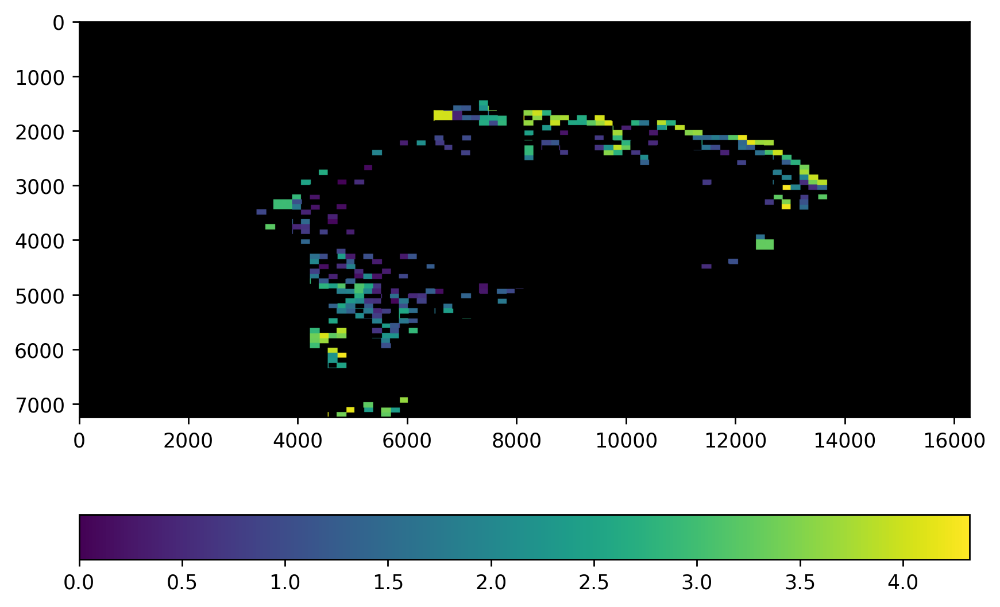

In [95]:
print(box_collocalized_scores_s2.min(), box_collocalized_scores_s2.max())
rotated_heat_demo_image_s2 = rotate(heat_demo_image_s2, -90, resize=True)

plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(rotated_heat_demo_image_s2, vmax=box_collocalized_scores_s2.min(), vmin=box_collocalized_scores_s2.max())
plt.colorbar(orientation='horizontal')
plt.savefig('collocalization_heatmap_normalized_cell_count_scene1_round2.pdf')

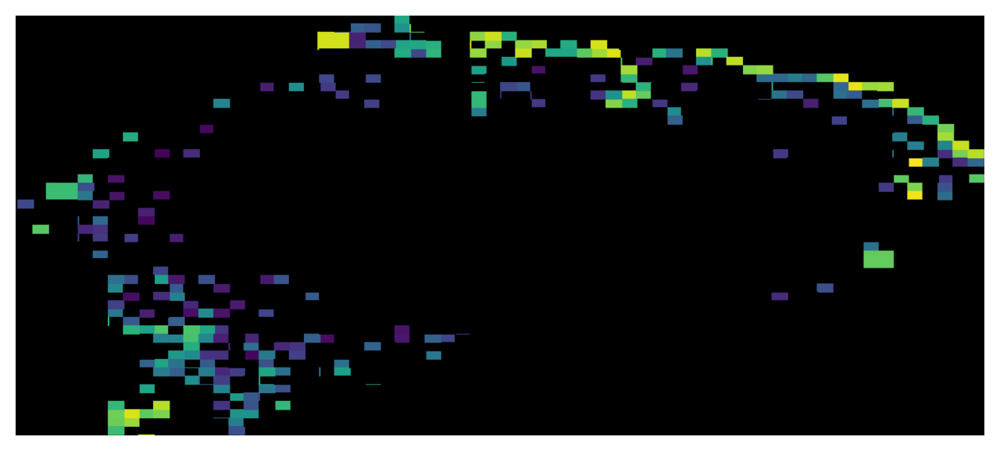

In [96]:
cropped_rotated_heat_demo_image = rotated_heat_demo_image_s2[x0:x1, y0:y1, :]
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.axis('off')
plt.imshow(cropped_rotated_heat_demo_image)
plt.savefig('centered_cropped_rotated_heatmap_scene1_R2.pdf')

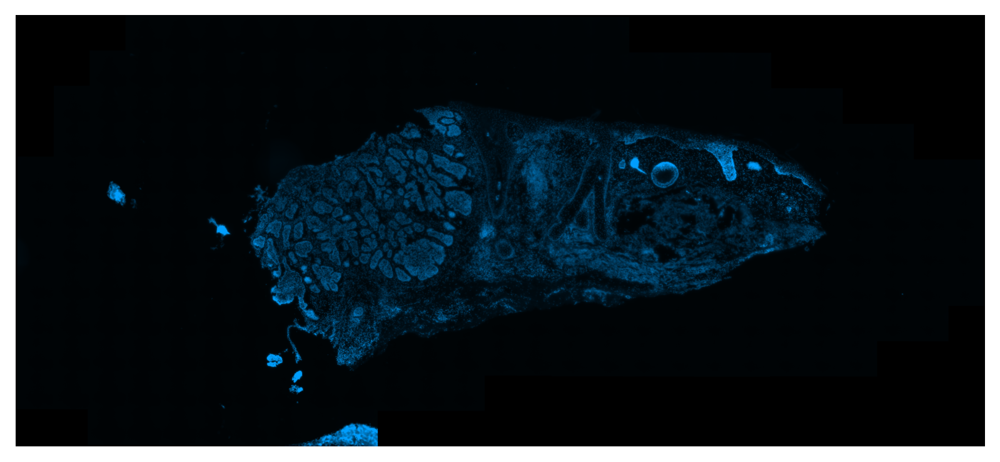

In [69]:
rotated_dapi2 = rotate(img_dapi2, -90, resize=True)
plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(rotated_dapi2)
# plt.colorbar()
plt.axis('off')
plt.savefig('rotated_dapi_scene2.pdf')

### Heatmap on registered images

In [106]:
moving_rgb_affine = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, affine_transform)
moving_rgb_final_4 = sitk_transform_rgb(moving_rgb_affine, pil_img_dapi1, bspline_transform)
# thumbnail(show_alignment(he, moving_rgb_final, prefilter = True))
# moving_rgb_final_3 = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, bspline_transform)
print(moving_rgb_final_4.size)
change_color_mv_rgb_final_4 = np.array(moving_rgb_final_4)
print(change_color_mv_rgb_final_4.shape)
foreground = Image.fromarray(cv2.cvtColor(change_color_mv_rgb_final_4, cv2.COLOR_BGR2RGB))
background = pil_img_dapi1
registered_r2_to_r1 = overlay_pil_imgs(background=background, foreground=foreground, alpha=0.5)

(7859, 17989)
(17989, 7859, 3)


In [53]:
scene1_output_dir = os.path.join(qupath_output, 'Scene_1.2')
list_output_files_s1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files_s1))
list_output_files_s1 = np.array(list_output_files_s1)
s1_cy3_coord = list()
# 'Centroid X', 'Centroid Y'
# Nucleus: DAPI mean
count_dot = 0
for fn in list_output_files_s1:
    if 'Cy3' in fn:

        df_json = convert_json2dataframe(fn, col_names)
        count_dot += len(df_json)
#         print(len(df_json))
#         if len(df_json) != 0 and count_dot >= 100:
#             print(count_dot)
#             1/0
        x_coords = df_json['Centroid X'].tolist()
        y_coords = df_json['Centroid Y'].tolist()
        coords = list(zip(x_coords, y_coords))
#         print(x_coords, y_coords, coords)        
        s1_cy3_coord.extend(coords)

print(len(s1_cy3_coord), count_dot)

6512
11477 11477


In [107]:
np_registered_r2_to_r1 = np.array(registered_r2_to_r1)
print(np_registered_r2_to_r1.shape, img_dapi1.shape)

(17989, 7859, 4) (17989, 7859, 3)


In [58]:
clone_registered = np_registered_r2_to_r1.copy()
for coord in s1_cy3_coord:
    x_coord, y_coord = coord
    annot_x, annot_y = convert_original2scaled(x_coord, y_coord, 
                                               (np_registered_r2_to_r1.shape[0], np_registered_r2_to_r1.shape[1]), 
                                               original_czi1_size)
    clone_registered = cv2.circle(clone_registered, (annot_x, annot_y), 15, (255,0,0), cv2.FILLED)


(-0.5, 17988.5, 7858.5, -0.5)

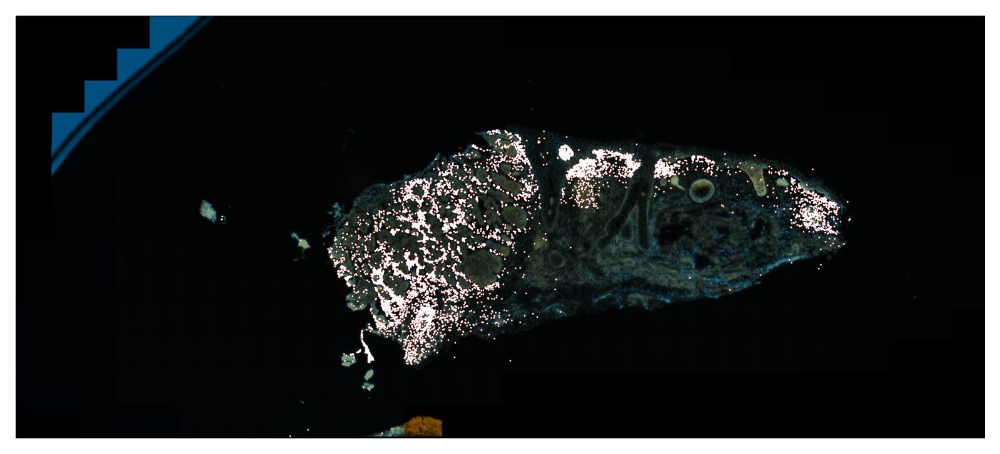

In [59]:
rotated_registered = rotate(clone_registered, -90, resize=True)
plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(rotated_registered)
# plt.colorbar()
plt.axis('off')

(-0.5, 17988.5, 7858.5, -0.5)

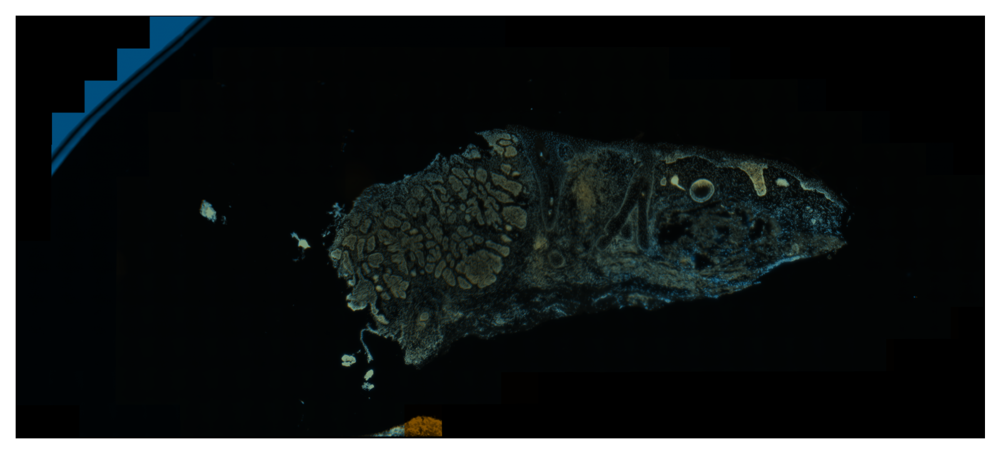

In [108]:
rotated_np_registered_r2_to_r1 = rotate(np_registered_r2_to_r1, -90, resize=True)
plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(rotated_np_registered_r2_to_r1)
# plt.colorbar()
plt.axis('off')

In [100]:
def inverse_transform_point(xform, p):
    """
    Returns the inverse-transform of a point.

    :param sitk.Transform xform: The transform to invert
    :param (float,float)|[float|float]|np.ndarray p: The point to find inverse for
    :return np.ndarray, bool: The point and whether the operation succeeded or not
    """

    def fun(x):
        return np.linalg.norm(xform.TransformPoint(x) - p)

    p = np.array(p)
    res = minimize(fun, p, method='Powell')
    return res.x, res.success

# def transform_point(transform, point):
#     transformed_point = transform.TransformPoint(point)
#     return transformed_point
#     print('Point ' + str(point) + ' transformed is ' + str(transformed_point))

def convert_rect_coords(transform, rects):
    x1, y1, x2, y2 = rects
#     print(rects)
    top_left, state_1 = inverse_transform_point(transform, (x1, y1))
    bottom_right, state_2 = inverse_transform_point(transform, (x2, y2))
    transformed1_x1, transformed1_y1 = top_left
    transformed1_x2, transformed1_y2 = bottom_right
    transformed_rect = (transformed1_x1, transformed1_y1, transformed1_x2, transformed1_y2)
#     print(transformed_rect)
#     1/0
    return transformed_rect

In [98]:
print(len(all_collocalized_rects_s2))

3831


In [103]:
# moving_rgb_affine = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, affine_transform)
# moving_rgb_final_4 = sitk_transform_rgb(moving_rgb_affine, pil_img_dapi1, bspline_transform)
print(len(all_collocalized_rects_s2))
registered_boxes_bspline = list()
registered_boxes_affine = list()
for rect in all_collocalized_rects_s2:
    transformed1_rect = convert_rect_coords(affine_transform, rect)
    transformed2_rect = convert_rect_coords(bspline_transform, transformed1_rect)
    registered_boxes_affine.append(transformed1_rect)
    registered_boxes_bspline.append(transformed2_rect)





3831


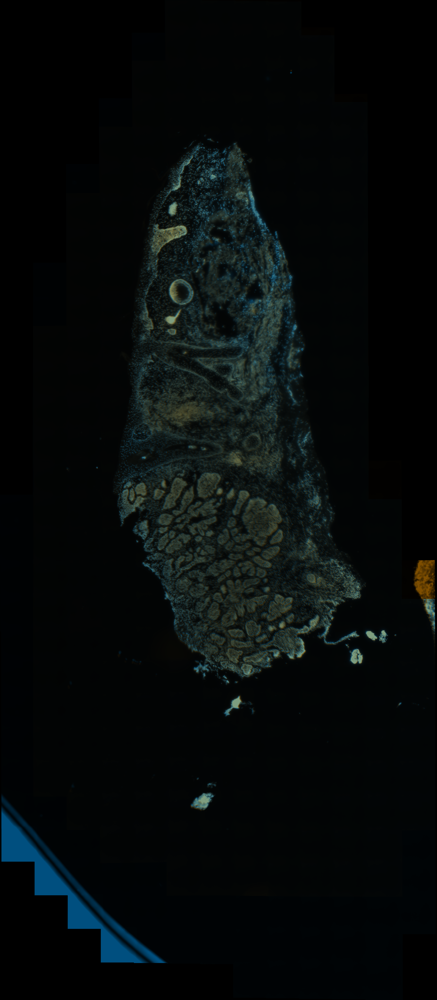

In [109]:
thumbnail(Image.fromarray(np_registered_r2_to_r1))

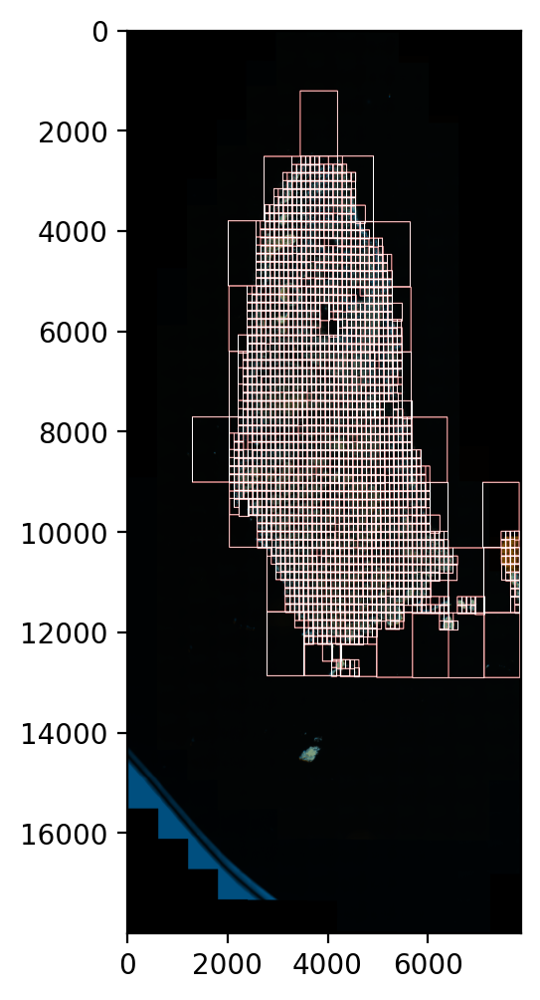

In [112]:

demo_image3 = draw_rectangles(np_registered_r2_to_r1, registered_boxes_bspline, color=[255, 0, 0], thickness=15)
# demo_image3 = draw_rectangles(demo_image3, all_collocalized_rects_s2, color=[0, 0, 255], thickness=30)

# print(len(registered_boxes))
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.imshow(demo_image3, vmax=255, vmin=0)

3831


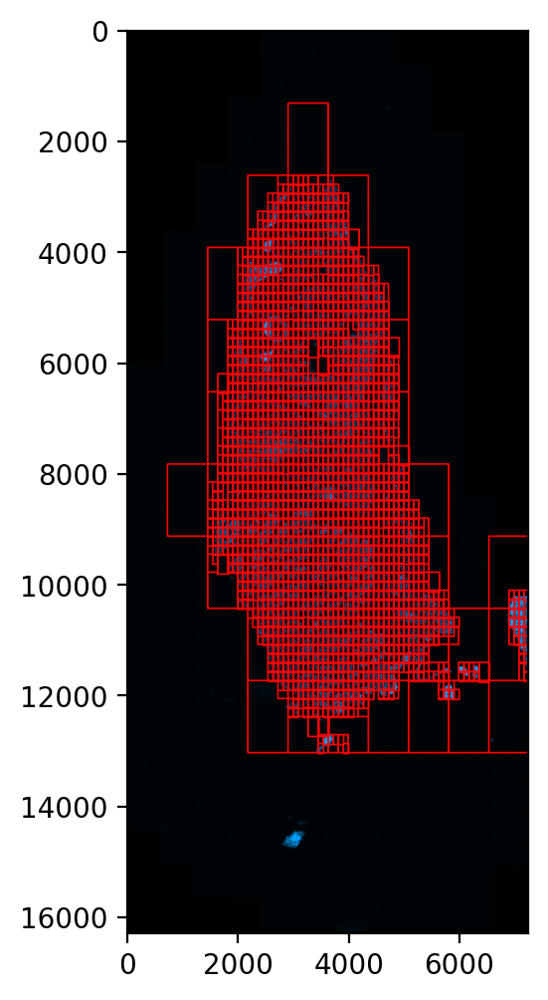

In [98]:
demo_image3 = draw_rectangles(img_dapi2, all_collocalized_rects_s2, color=[255, 0, 0], thickness=30)
print(len(all_collocalized_rects_s2))
plt.figure(num=None, figsize=(8, 6), dpi=200, facecolor='w', edgecolor='k')
plt.imshow(demo_image3, vmax=255, vmin=0)

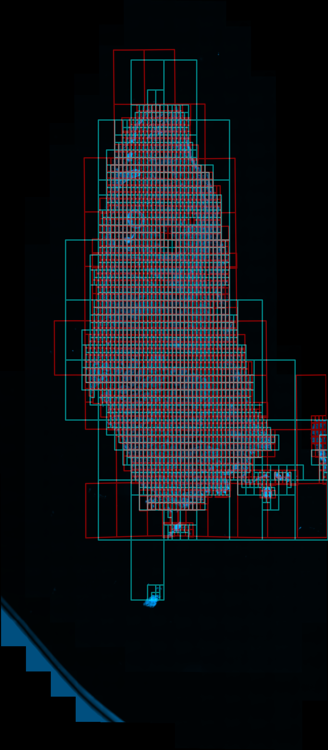

In [115]:
thumbnail(overlayed_annot, size = (750,750))

##### Grab all THY1 coords from first round

In [47]:
print(col_names)

Index(['Name', 'ROI', 'Centroid X', 'Centroid Y', 'Nucleus: Area',
       'Nucleus: Perimeter', 'Nucleus: Circularity', 'Nucleus: Max caliper',
       'Nucleus: Min caliper', 'Nucleus: Eccentricity', 'Nucleus: Cy7 mean',
       'Nucleus: Cy7 sum', 'Nucleus: Cy7 std dev', 'Nucleus: Cy7 max',
       'Nucleus: Cy7 min', 'Nucleus: Cy7 range', 'Nucleus: Cy5 mean',
       'Nucleus: Cy5 sum', 'Nucleus: Cy5 std dev', 'Nucleus: Cy5 max',
       'Nucleus: Cy5 min', 'Nucleus: Cy5 range', 'Nucleus: Cy3 mean',
       'Nucleus: Cy3 sum', 'Nucleus: Cy3 std dev', 'Nucleus: Cy3 max',
       'Nucleus: Cy3 min', 'Nucleus: Cy3 range', 'Nucleus: DAPI mean',
       'Nucleus: DAPI sum', 'Nucleus: DAPI std dev', 'Nucleus: DAPI max',
       'Nucleus: DAPI min', 'Nucleus: DAPI range', 'Cell: Area',
       'Cell: Perimeter', 'Cell: Circularity', 'Cell: Max caliper',
       'Cell: Min caliper', 'Cell: Eccentricity', 'Cell: Cy7 mean',
       'Cell: Cy7 std dev', 'Cell: Cy7 max', 'Cell: Cy7 min', 'Cell: Cy5 mean',


In [95]:
scene1_output_dir = os.path.join(qupath_output, 'Scene_1.2')
list_output_files_s1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files_s1))
list_output_files_s1 = np.array(list_output_files_s1)
s1_cy3_coord = list()
# 'Centroid X', 'Centroid Y'
# Nucleus: DAPI mean
count_dot = 0
for fn in list_output_files_s1:
    if 'Cy3' in fn:

        df_json = convert_json2dataframe(fn, col_names)
        count_dot += len(df_json)
#         print(len(df_json))
#         if len(df_json) != 0 and count_dot >= 100:
#             print(count_dot)
#             1/0
        x_coords = df_json['Centroid X'].tolist()
        y_coords = df_json['Centroid Y'].tolist()
        coords = list(zip(x_coords, y_coords))
#         print(x_coords, y_coords, coords)        
        s1_cy3_coord.extend(coords)

print(len(s1_cy3_coord), count_dot)

6512
11477 11477


In [117]:
# s1_cy3_coord.sort(key=x_element)
clone_dapi1 = img_dapi1.copy()
for coord in s1_cy3_coord:
    x_coord, y_coord = coord
    annot_x, annot_y = convert_original2scaled(x_coord, y_coord, 
                                               (img_dapi1.shape[0], img_dapi1.shape[1]), 
                                               original_czi1_size)
    clone_dapi1 = cv2.circle(clone_dapi1, (annot_x, annot_y), 15, (255,0,0), cv2.FILLED)


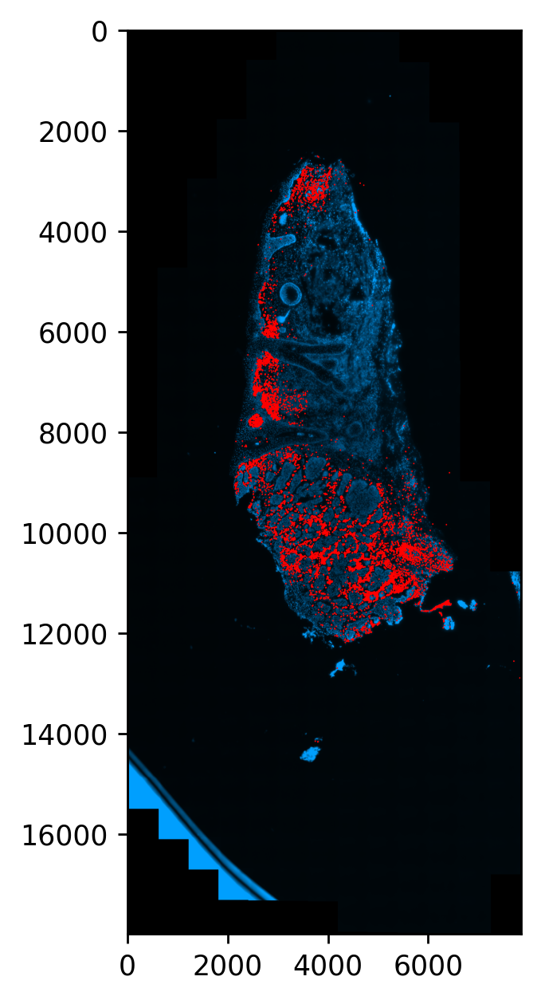

In [118]:
# print(box_collocalized_scores_s2.min(), box_collocalized_scores_s2.max())
# clone_dapi1 = rotate(clone_dapi1, -90, resize=True)

plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(clone_dapi1)


In [102]:
scene1_output_dir = os.path.join(qupath_output, 'Scene_1')
list_output_files_s1 = get_files_in_dir_recursively(scene1_output_dir)
print(len(list_output_files_s1))
list_output_files_s1 = np.array(list_output_files_s1)
s1_cy7_coord = list()
# 'Centroid X', 'Centroid Y'
# Nucleus: DAPI mean
count_dot = 0
for fn in list_output_files_s1:
    if 'Cy7' in fn:

        df_json = convert_json2dataframe(fn, col_names)
        count_dot += len(df_json)
#         print(len(df_json))
#         if len(df_json) != 0 and count_dot >= 100:
#             print(count_dot)
#             1/0
        x_coords = df_json['Centroid X'].tolist()
        y_coords = df_json['Centroid Y'].tolist()
        coords = list(zip(x_coords, y_coords))
#         print(x_coords, y_coords, coords)        
        s1_cy7_coord.extend(coords)

print(len(s1_cy7_coord), count_dot)

6224
9612 9612


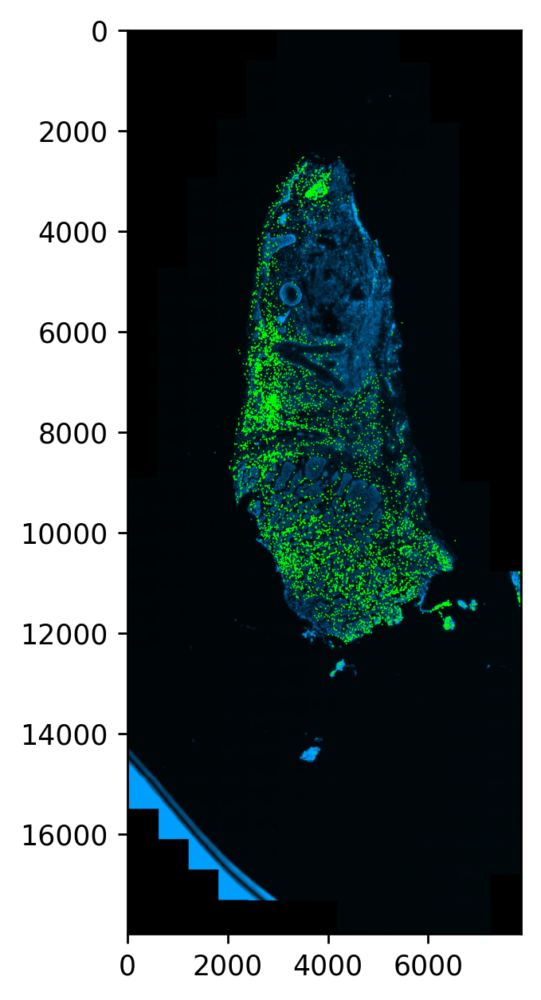

In [119]:
clone_dapi1 = img_dapi1.copy()
for coord in s1_cy7_coord:
    x_coord, y_coord = coord
    annot_x, annot_y = convert_original2scaled(x_coord, y_coord, 
                                               (img_dapi1.shape[0], img_dapi1.shape[1]), 
                                               original_czi1_size)
    clone_dapi1 = cv2.circle(clone_dapi1, (annot_x, annot_y), 15, (0, 255, 0),cv2.FILLED)

plt.figure(num=None, figsize=(8, 6), dpi=250, facecolor='w', edgecolor='k')
plt.imshow(clone_dapi1)

In [124]:
clone_dapi2 = img_dapi2.copy()

clone_dapi2 = cv2.circle(clone_dapi2, (1500, 2000), 45, (0, 255, 0),cv2.FILLED)

pil_clone_dapi2 = Image.fromarray(clone_dapi2)

In [125]:
moving_rgb_affine2 = sitk_transform_rgb(pil_clone_dapi2, pil_img_dapi1, affine_transform)
moving_rgb_final_4 = sitk_transform_rgb(moving_rgb_affine2, pil_img_dapi1, bspline_transform)
# thumbnail(show_alignment(he, moving_rgb_final, prefilter = True))
# moving_rgb_final_3 = sitk_transform_rgb(pil_img_dapi2, pil_img_dapi1, bspline_transform)
print(moving_rgb_final_4.size)
change_moving_rgb_final_4 = np.array(moving_rgb_final_4)
print(change_color_mv_rgb_final_4.shape)
foreground = Image.fromarray(cv2.cvtColor(change_moving_rgb_final_4, cv2.COLOR_BGR2RGB))
background = pil_img_dapi1
test_transform = overlay_pil_imgs(background=background, foreground=foreground, alpha=0.5)

(7859, 17989)
(17989, 7859, 3)


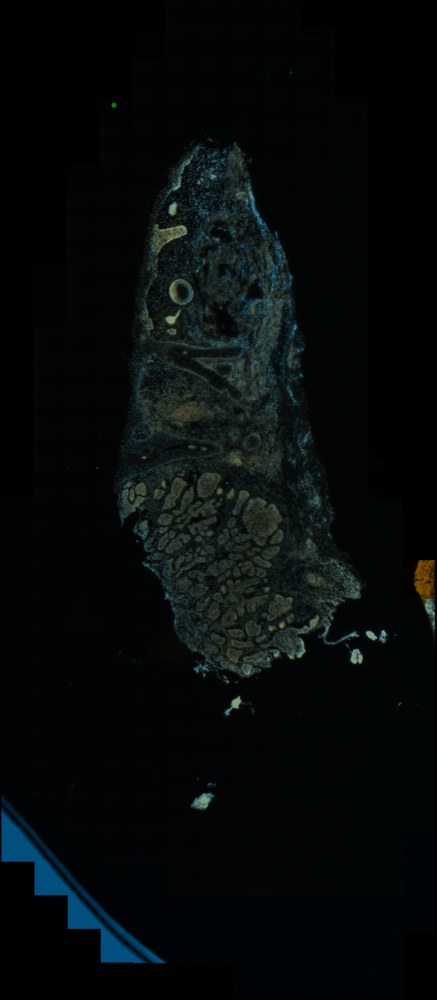

In [126]:
thumbnail(test_transform, (1000, 1000))

(1550.0, 2050.0, 3.0)
(997.8679407701223, 2158.808030660127)
(1001.0342427461021, 2160.777946814807) <class 'tuple'>
[1001.0342427461021, 2160.777946814807, 3.0] <class 'list'>
(1001.0342427461021, 2160.777946814807, 3.0)


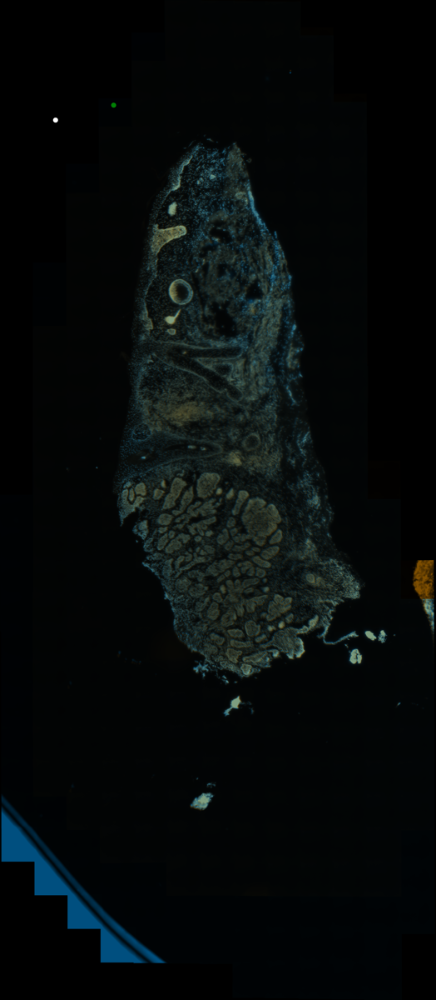

In [165]:
itk_clone_dapi2 = get_itk_from_pil(Image.fromarray(clone_dapi2))
cont_point = itk_clone_dapi2.TransformContinuousIndexToPhysicalPoint((1550, 2050,3))
print(cont_point)
affine_1 = transform_point(affine_transform, cont_point[0:2])
print(affine_1)
bspline_1 = transform_point(bspline_transform, affine_1)
print(bspline_1, type(bspline_1))
bspline_1 = list(bspline_1)
bspline_1.append(3.0)
print(bspline_1, type(bspline_1))
new_loc = get_itk_from_pil(test_transform).TransformPhysicalPointToContinuousIndex(bspline_1)
print(new_loc)
new_loc_2  = tuple(list_to_int(new_loc[0:2]))
clone_test_transform = np.array(test_transform)
clone_test_transform = cv2.circle(clone_test_transform, new_loc_2, 45, (0, 255, 0),cv2.FILLED)

pil_clone_dapi2 = Image.fromarray(clone_test_transform)
thumbnail(pil_clone_dapi2, (1200, 1200))

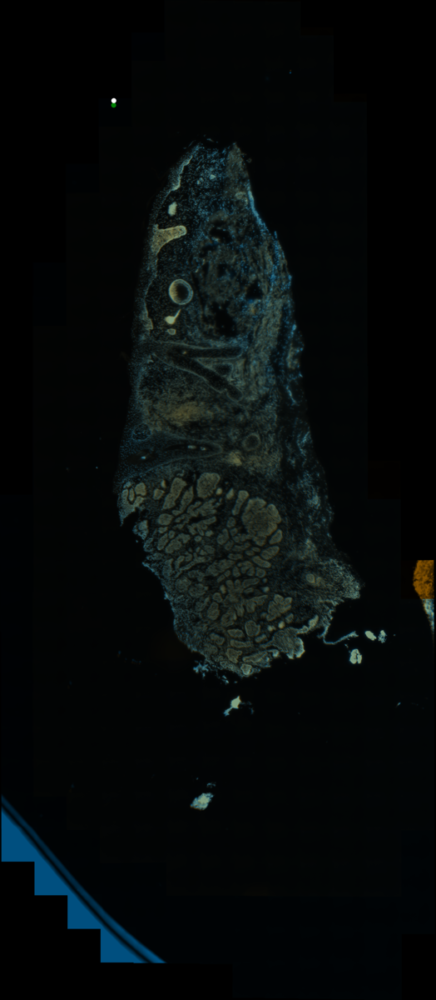

In [181]:


# affine_1 = transform_point(affine_transform, (1500, 2000))
# print(affine_1)
# bspline_1 = transform_point(bspline_transform, affine_1)
# print(bspline_1)
# print(list_to_int(bspline_1))
clone_test_transform = np.array(test_transform)
clone_test_transform = cv2.circle(clone_test_transform, (2051, 1810), 45, (0, 255, 0),cv2.FILLED)

pil_clone_dapi2 = Image.fromarray(clone_test_transform)
thumbnail(pil_clone_dapi2, (1200, 1200))

Object `sitk.Image.TransformContinuousIndexToPhysicalPoint()` not found.
